In [1]:
import pickle
from rbbm_src.labelling_func_src.src.LFRepair import fix_rules_with_solver_input
import pydot
from IPython.display import Image, display

[nltk_data] Downloading package words to /home/opc/nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package stopwords to /home/opc/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
2024-10-10 02:39:31.256314: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-10-10 02:39:31.309073: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-10-10 02:39:31.310373: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
DEBUG 2024-10-10 02:39:32,154 [tpu_cluster_resolver.py:<module>:32] Falling back to TensorFlow client; we recommended you install the Cloud TPU client directly with pip install c

# algorithm 

1. When we extend a left branch (no matter where), we create a new tree
2. If the parent of the current left branch is not root, add the previous ancestors (starting from root, and every "right turn" the 

In [2]:
import copy

In [3]:
from collections import deque

In [4]:
from rbbm_src.labelling_func_src.src.TreeRules import PredicateNode,TreeRule,ABSTAIN, SPAM, HAM,LabelNode

In [5]:
def dup_right_ancestors(cur_node, right_ancestors, input_tree):
#     new_ancestor_objs = [copy.deepcopy(r) for r in right_ancestors]
#     right_ancestors.append(cur_node)
#     print("in the dup step, cur node: ")
#     print(cur_node.pred)
#     print("new_ancestor_objs")
#     print([x.pred for x in new_ancestor_objs])
#     print('\n')
    if(right_ancestors):
        for i in range(0, len(right_ancestors)-1):
            input_tree.max_node_id+=1
            right_ancestors[i].right=right_ancestors[i+1]
            right_ancestors[i].left = LabelNode(number=input_tree.max_node_id, label=ABSTAIN, 
                                                pairs={ABSTAIN:[], SPAM:[], HAM:[]}, used_predicates=set([]))
            right_ancestors[i+1].parent=right_ancestors[i]
            
        right_ancestors[-1].right=cur_node
        cur_node.parent=right_ancestors[-1]
        root=right_ancestors[0]
    else:
        root=cur_node
    return TreeRule(rtype='lf', root=root, 
                    size=2*len(right_ancestors)+1, max_node_id=input_tree.max_node_id, is_good=True)
            
        
        
def post_process_break_tree_to_subtrees(input_tree):
    
    queue = deque([[input_tree.root,[]]])
    new_trees = [input_tree]
    
    """
    1: queue = [(A,[])], res = [A] 
    2: while(q) 
        cur_node, R_ancestors = q.popleft() 
        if(cur_node.left is Predicate): new_root = dupRancestors(cur_node.left, R_ancestors) 
        res.append(new_root) 
        queue.append((cur_node.left, R_ancestors)) 
        cur_node.left=LabelNode(ABSTAIN) 
        if(cur_node.right is Predicate): new_ancestors = R_ancestors + cur_node 
        queue.append((cur_node.right, new_ancestors))
        
    """
    
    # first traversal, create sub trees
    while(queue):
        print(f"current queue: ({queue[0][0].pred}, {[n.pred for n in queue[0][1]]})")
        cur_node, rancestors = queue.popleft()
        print(f"cur_node: {cur_node.pred}, rancestors: {[x.pred for x in rancestors]}")
        if(cur_node.left):
            if(isinstance(cur_node.left, PredicateNode)):
                
                new_trees.append(dup_right_ancestors(cur_node=cur_node.left, 
                                                     right_ancestors=rancestors,
                                                    input_tree=input_tree
                                                    ))
                new_ancestor_objs = [copy.deepcopy(r) for r in rancestors]
                queue.append([cur_node.left, new_ancestor_objs])
                input_tree.max_node_id+=1
                cur_node.left = LabelNode(number=input_tree.max_node_id, label=ABSTAIN, 
                            pairs={ABSTAIN:[], SPAM:[], HAM:[]}, used_predicates=set([]))
                cur_node.left.parent=None
                print('\n')
                
        if(cur_node.right):
            if(isinstance(cur_node.right, PredicateNode)):
                new_ancestor_objs = [copy.deepcopy(r) for r in rancestors]
                new_ancestor_objs.append(copy.deepcopy(cur_node))
                queue.append([cur_node.right, new_ancestor_objs])
#             else:
#                 new_trees.append(dup_right_ancestors(cur_node=cur_node, 
#                                      right_ancestors=rancestors,
#                                     input_tree=input_tree
#                                     ))
    
        
    return new_trees

In [6]:
with open('random_sample_state42_amazon_full_la_0.4_ia_0.75_input.pkl', 'rb') as f04075:
    input_04075 = pickle.load(f04075)

In [7]:
for i in input_04075:
    input_04075[i]['user_input']['id'] = input_04075[i]['user_input'].reset_index().index
fix_rules_with_solver_input(fix_book_keeping_dict=input_04075)

In [8]:
new_rules = []

original tree 0


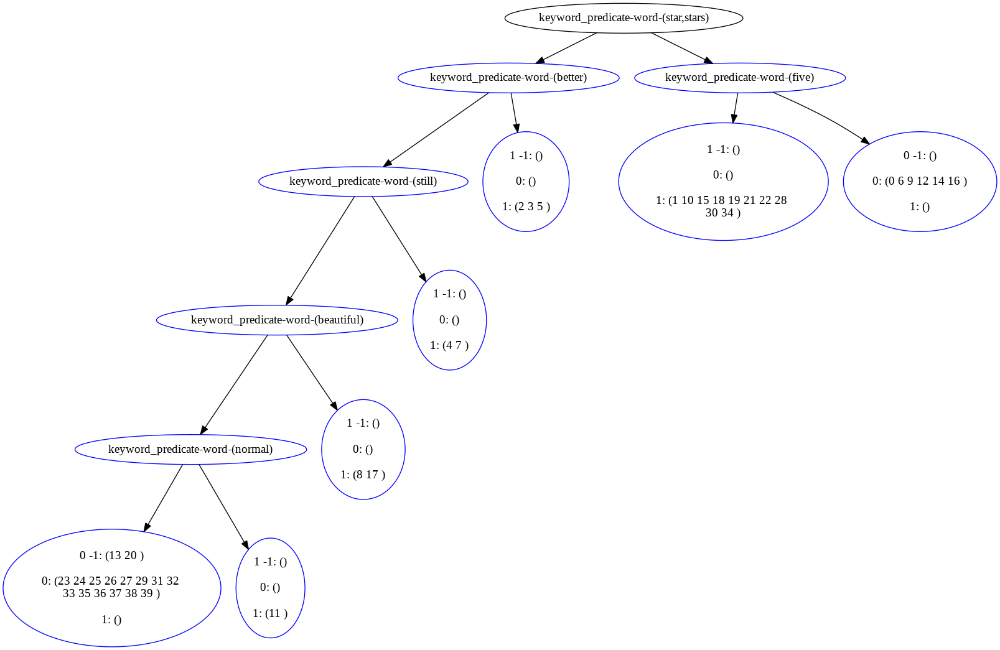

current queue: (keyword_predicate-word-(star,stars), [])
cur_node: keyword_predicate-word-(star,stars), rancestors: []


current queue: (keyword_predicate-word-(better), [])
cur_node: keyword_predicate-word-(better), rancestors: []


current queue: (keyword_predicate-word-(five), [keyword_predicate-word-(star,stars)])
cur_node: keyword_predicate-word-(five), rancestors: [keyword_predicate-word-(star,stars)]
current queue: (keyword_predicate-word-(still), [])
cur_node: keyword_predicate-word-(still), rancestors: []


current queue: (keyword_predicate-word-(beautiful), [])
cur_node: keyword_predicate-word-(beautiful), rancestors: []


current queue: (keyword_predicate-word-(normal), [])
cur_node: keyword_predicate-word-(normal), rancestors: []
new trees from cur rule:
[PredicateNode(id=1, pred=keyword_predicate-word-(star,stars))
    LabelNode(id=19, label=-1)
    PredicateNode(id=4, pred=keyword_predicate-word-(five), added=True)
        LabelNode(id=5, label=1, added=True)
        Labe

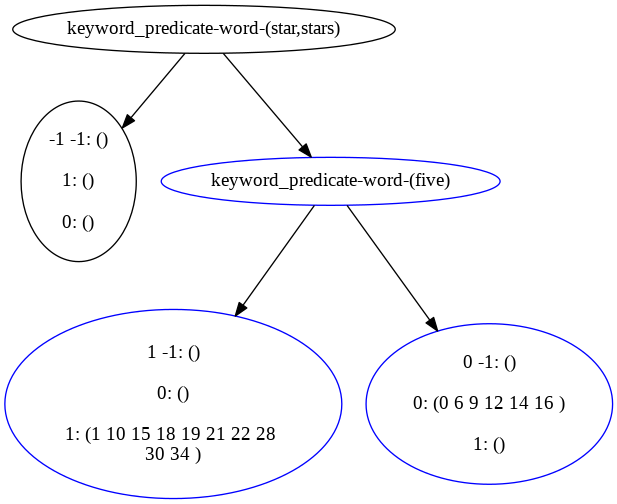

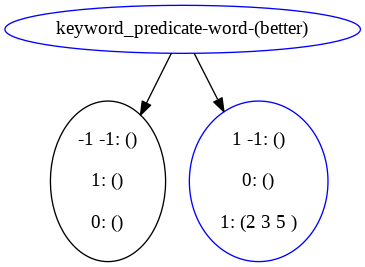

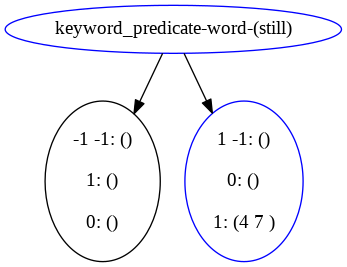

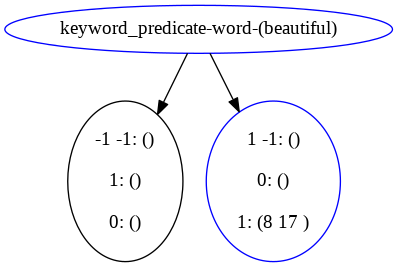

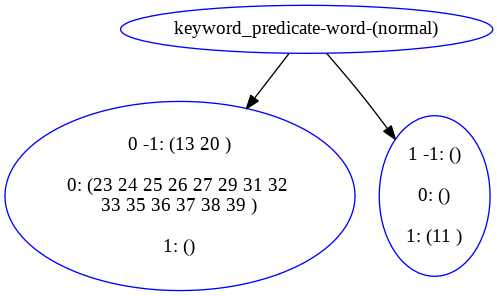



***********************************
the original tree now becomes: 


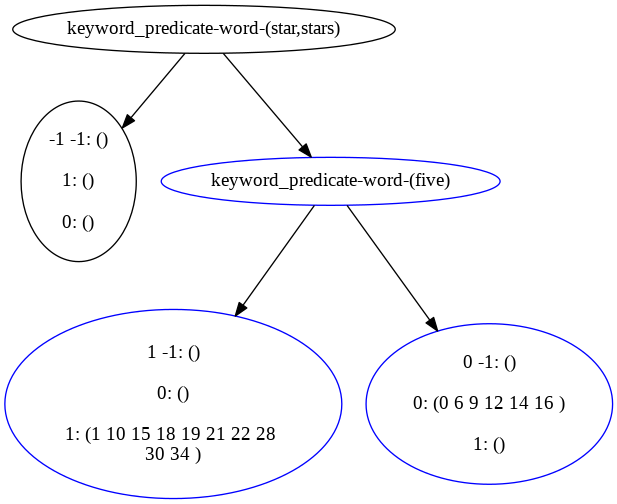

-----------------------------------------------------
original tree 1


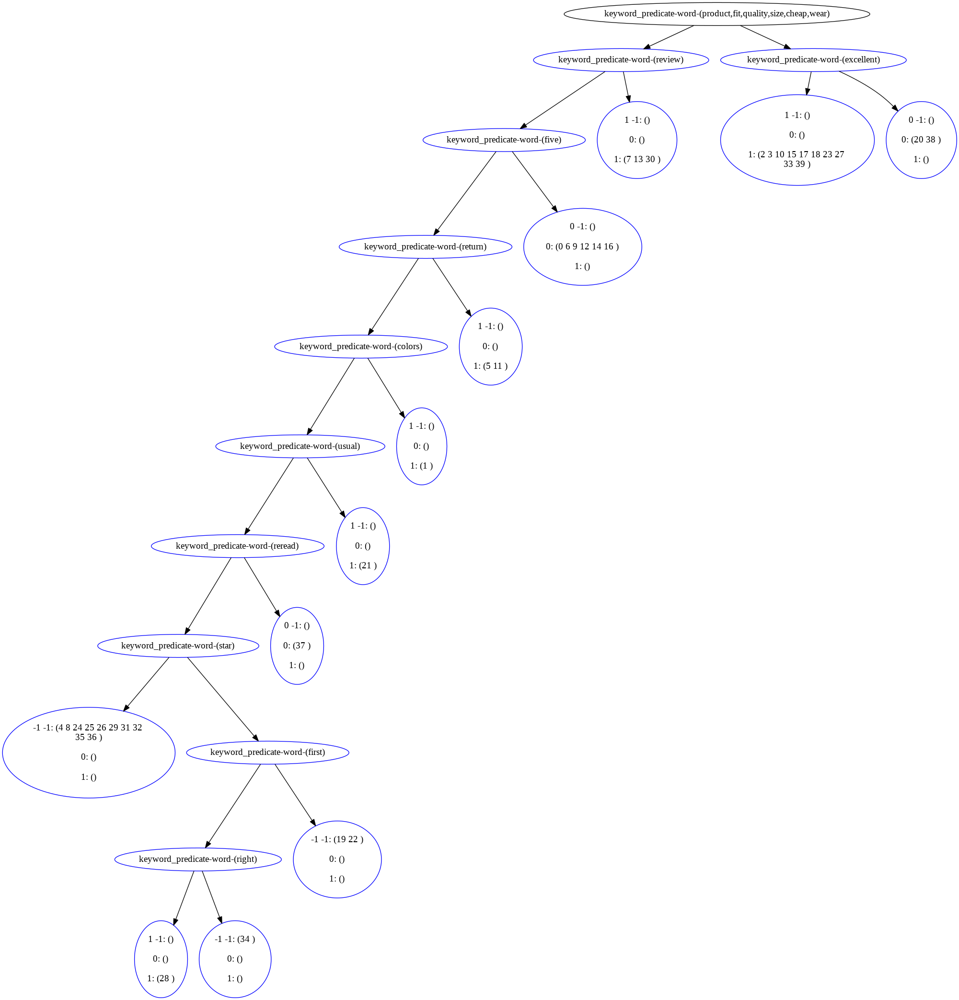

current queue: (keyword_predicate-word-(product,fit,quality,size,cheap,wear), [])
cur_node: keyword_predicate-word-(product,fit,quality,size,cheap,wear), rancestors: []


current queue: (keyword_predicate-word-(review), [])
cur_node: keyword_predicate-word-(review), rancestors: []


current queue: (keyword_predicate-word-(excellent), [keyword_predicate-word-(product,fit,quality,size,cheap,wear)])
cur_node: keyword_predicate-word-(excellent), rancestors: [keyword_predicate-word-(product,fit,quality,size,cheap,wear)]
current queue: (keyword_predicate-word-(five), [])
cur_node: keyword_predicate-word-(five), rancestors: []


current queue: (keyword_predicate-word-(return), [])
cur_node: keyword_predicate-word-(return), rancestors: []


current queue: (keyword_predicate-word-(colors), [])
cur_node: keyword_predicate-word-(colors), rancestors: []


current queue: (keyword_predicate-word-(usual), [])
cur_node: keyword_predicate-word-(usual), rancestors: []


current queue: (keyword_predicate

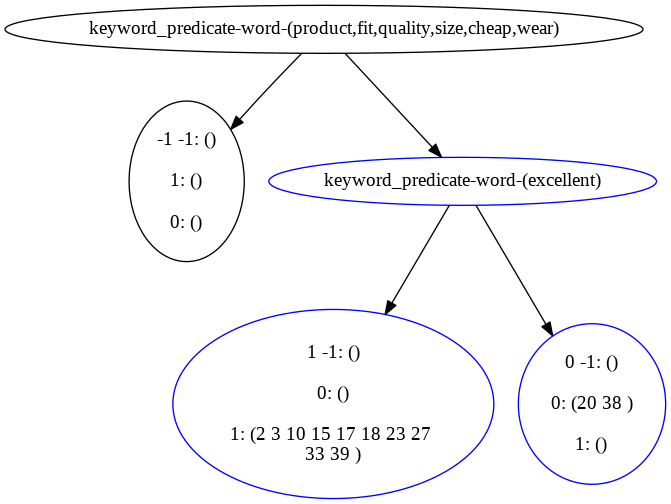

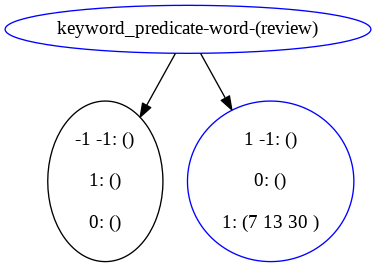

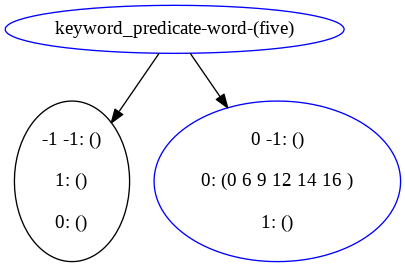

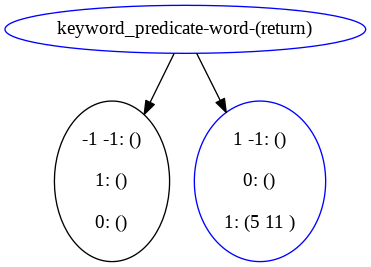

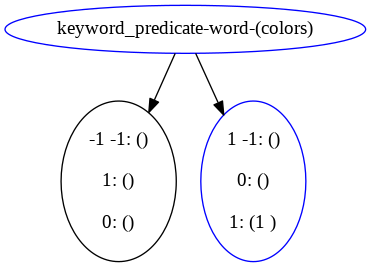

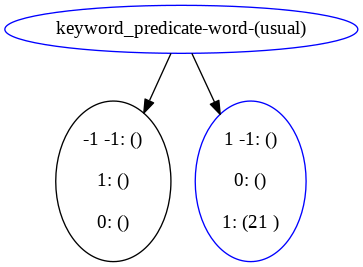

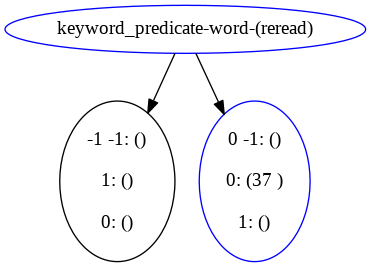

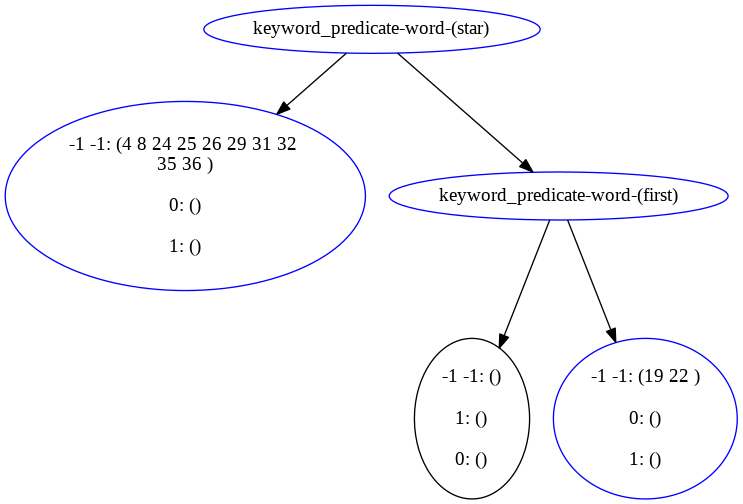

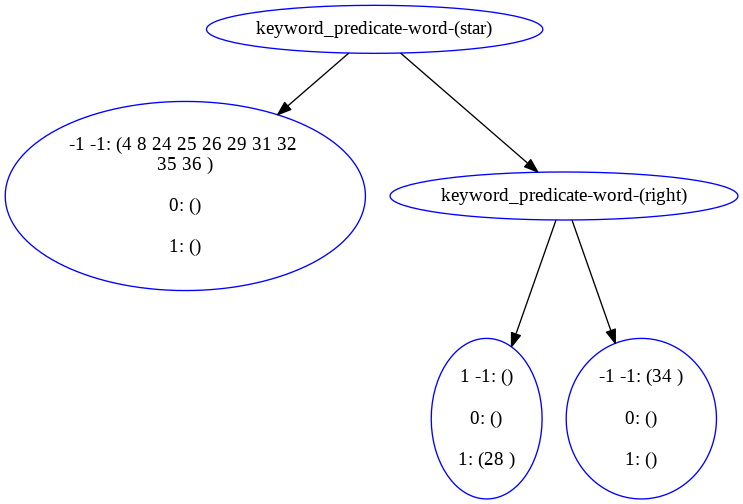



***********************************
the original tree now becomes: 


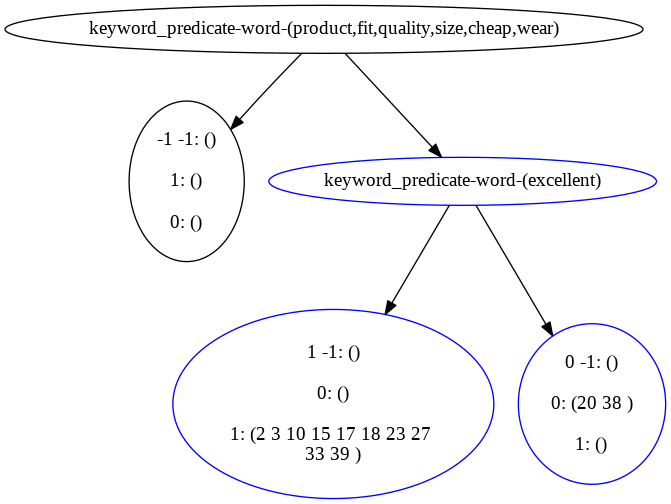

-----------------------------------------------------
original tree 2


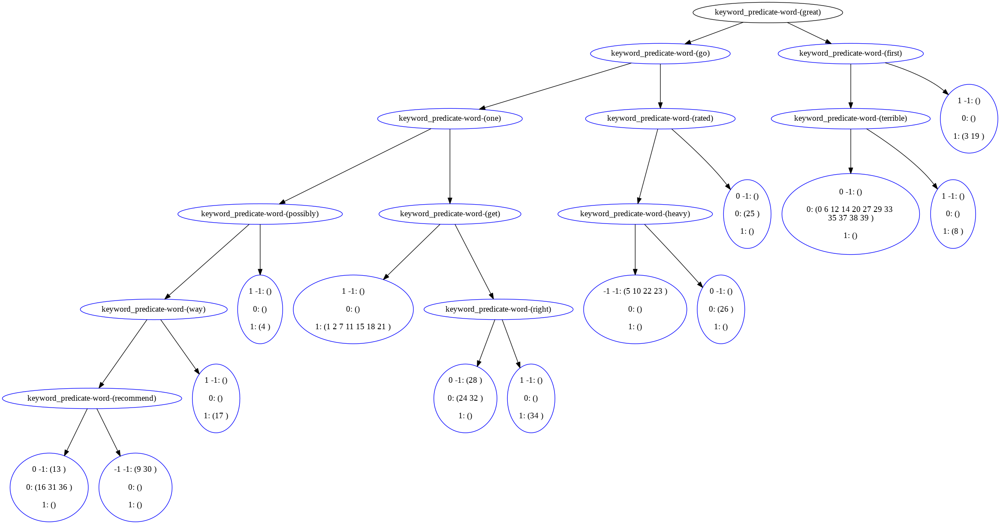

current queue: (keyword_predicate-word-(great), [])
cur_node: keyword_predicate-word-(great), rancestors: []


current queue: (keyword_predicate-word-(go), [])
cur_node: keyword_predicate-word-(go), rancestors: []


current queue: (keyword_predicate-word-(first), [keyword_predicate-word-(great)])
cur_node: keyword_predicate-word-(first), rancestors: [keyword_predicate-word-(great)]


current queue: (keyword_predicate-word-(one), [])
cur_node: keyword_predicate-word-(one), rancestors: []


current queue: (keyword_predicate-word-(rated), [keyword_predicate-word-(go)])
cur_node: keyword_predicate-word-(rated), rancestors: [keyword_predicate-word-(go)]


current queue: (keyword_predicate-word-(terrible), [keyword_predicate-word-(great)])
cur_node: keyword_predicate-word-(terrible), rancestors: [keyword_predicate-word-(great)]
current queue: (keyword_predicate-word-(possibly), [])
cur_node: keyword_predicate-word-(possibly), rancestors: []


current queue: (keyword_predicate-word-(get), [ke

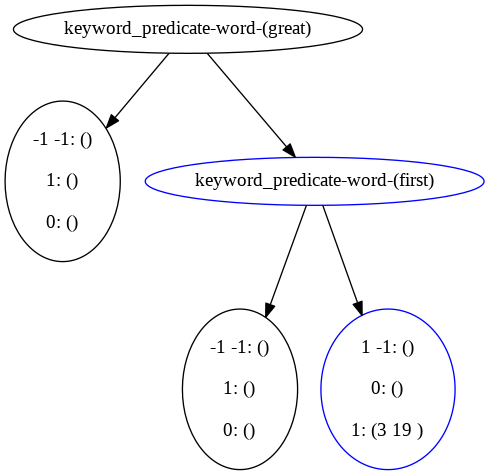

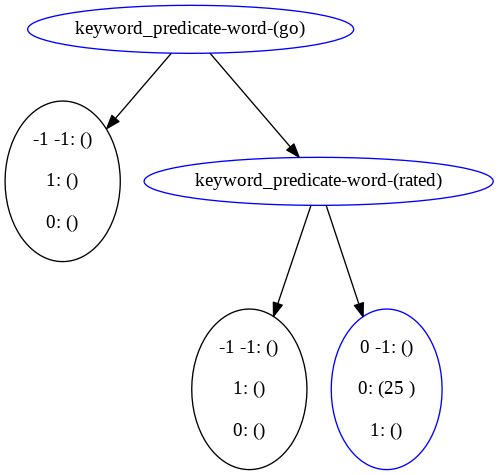

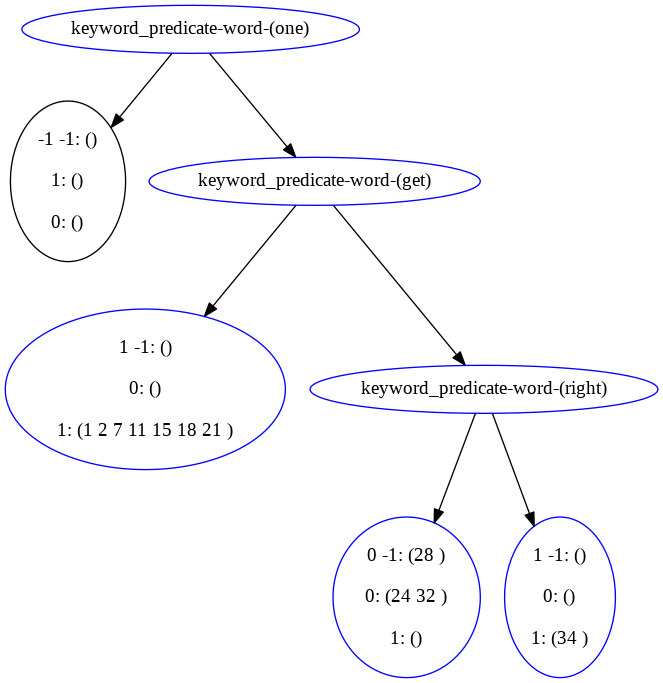

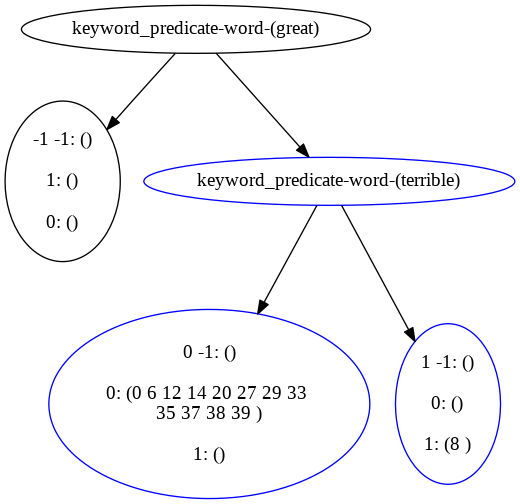

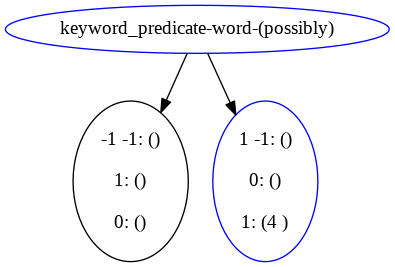

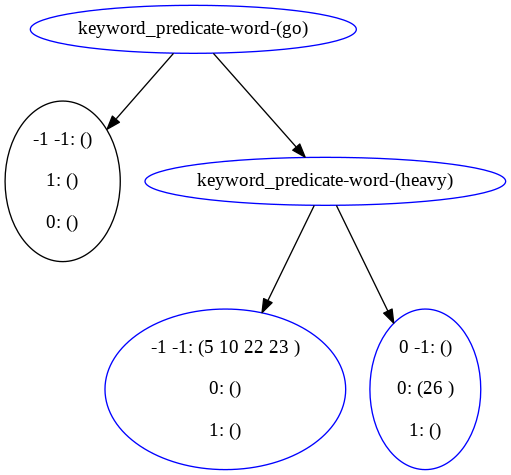

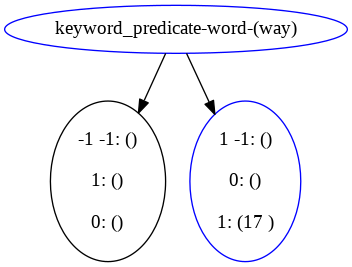

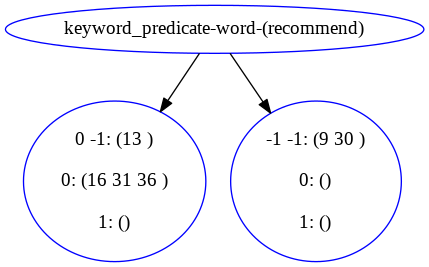



***********************************
the original tree now becomes: 


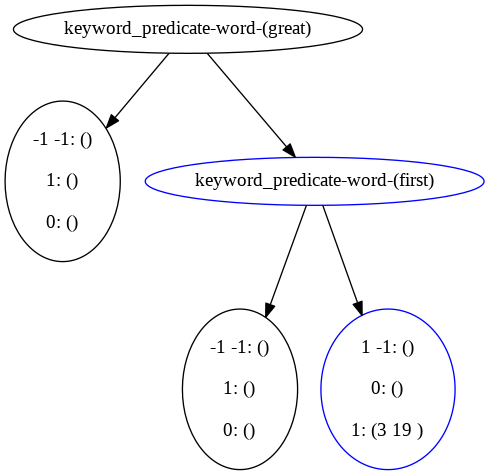

-----------------------------------------------------
original tree 3


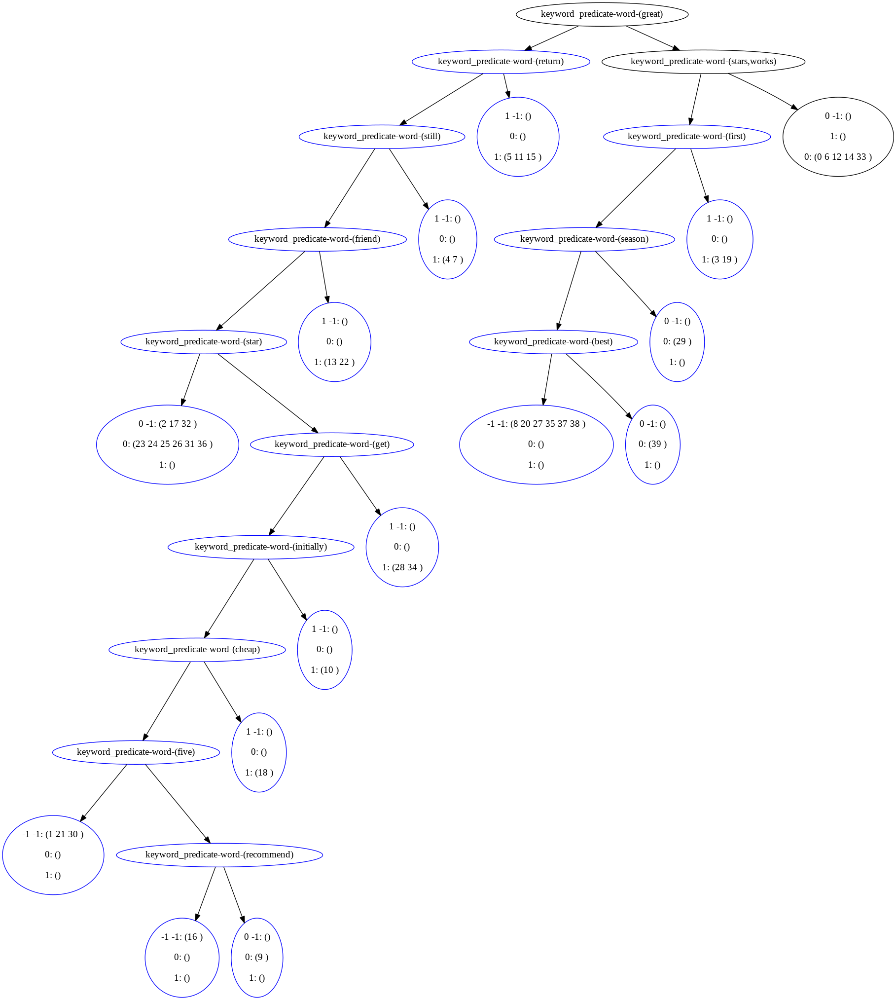

current queue: (keyword_predicate-word-(great), [])
cur_node: keyword_predicate-word-(great), rancestors: []


current queue: (keyword_predicate-word-(return), [])
cur_node: keyword_predicate-word-(return), rancestors: []


current queue: (keyword_predicate-word-(stars,works), [keyword_predicate-word-(great)])
cur_node: keyword_predicate-word-(stars,works), rancestors: [keyword_predicate-word-(great)]


current queue: (keyword_predicate-word-(still), [])
cur_node: keyword_predicate-word-(still), rancestors: []


current queue: (keyword_predicate-word-(first), [keyword_predicate-word-(great)])
cur_node: keyword_predicate-word-(first), rancestors: [keyword_predicate-word-(great)]


current queue: (keyword_predicate-word-(friend), [])
cur_node: keyword_predicate-word-(friend), rancestors: []


current queue: (keyword_predicate-word-(season), [keyword_predicate-word-(great)])
cur_node: keyword_predicate-word-(season), rancestors: [keyword_predicate-word-(great)]


current queue: (keyword_p

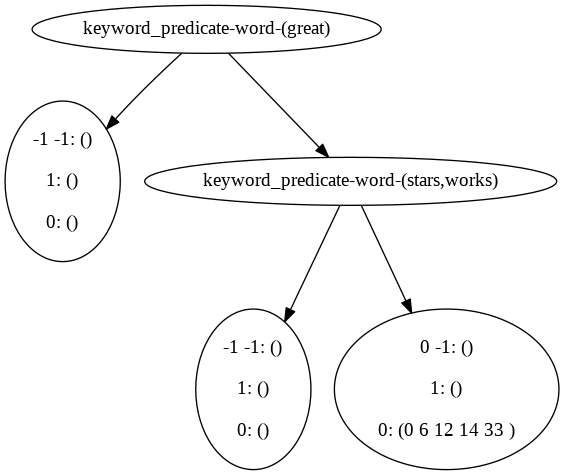

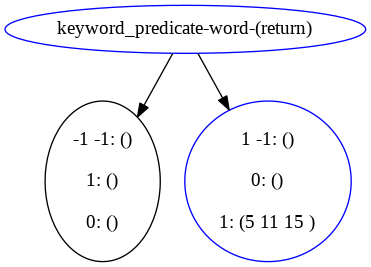

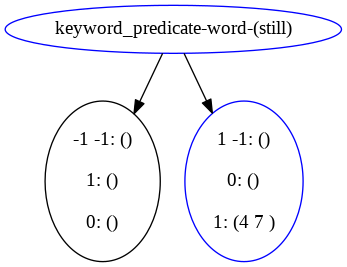

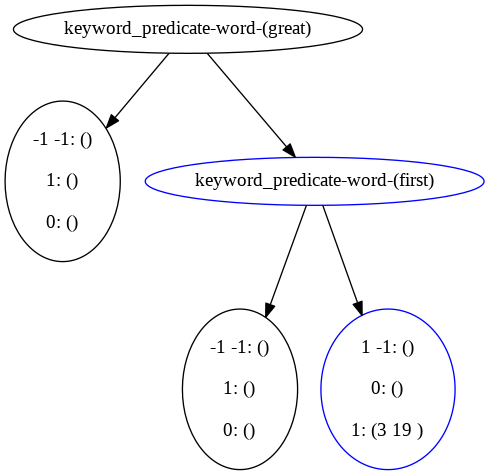

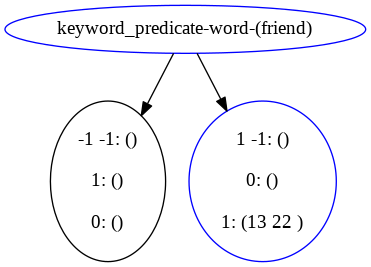

...

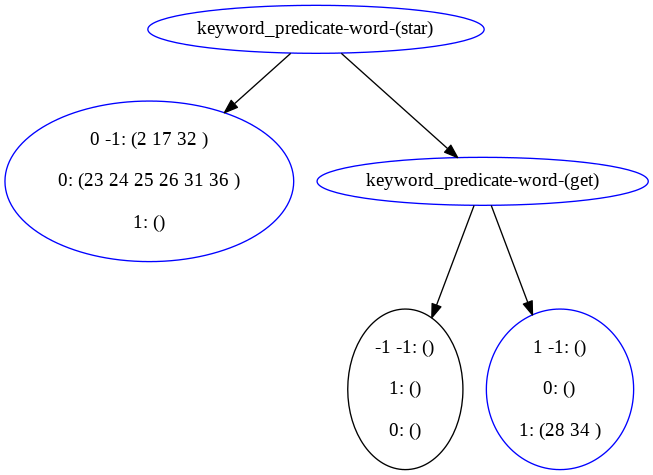

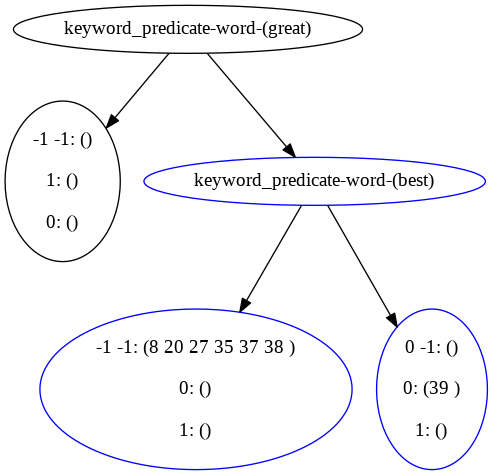

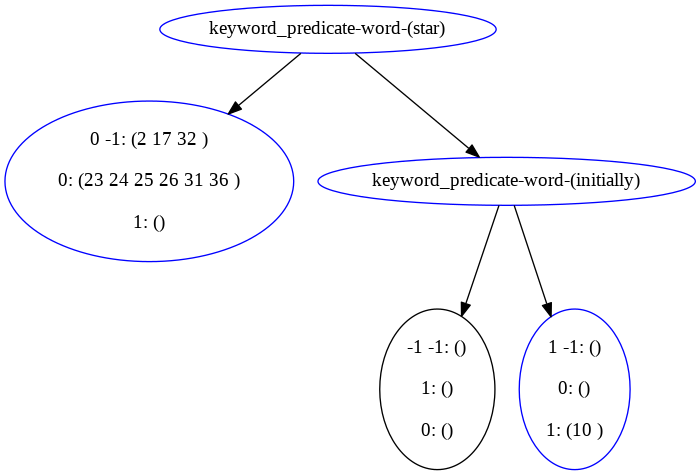

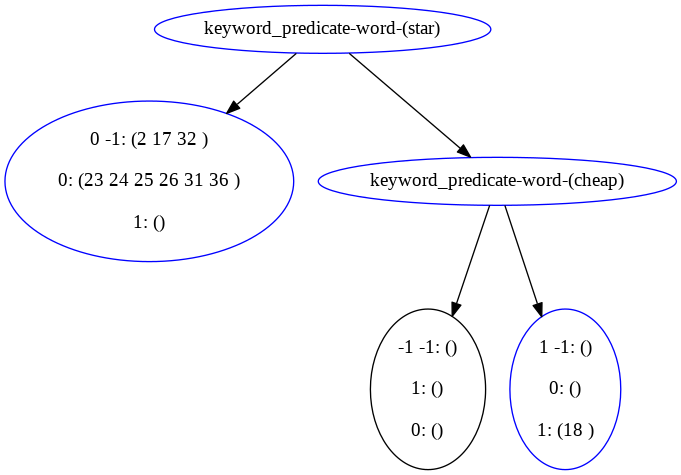

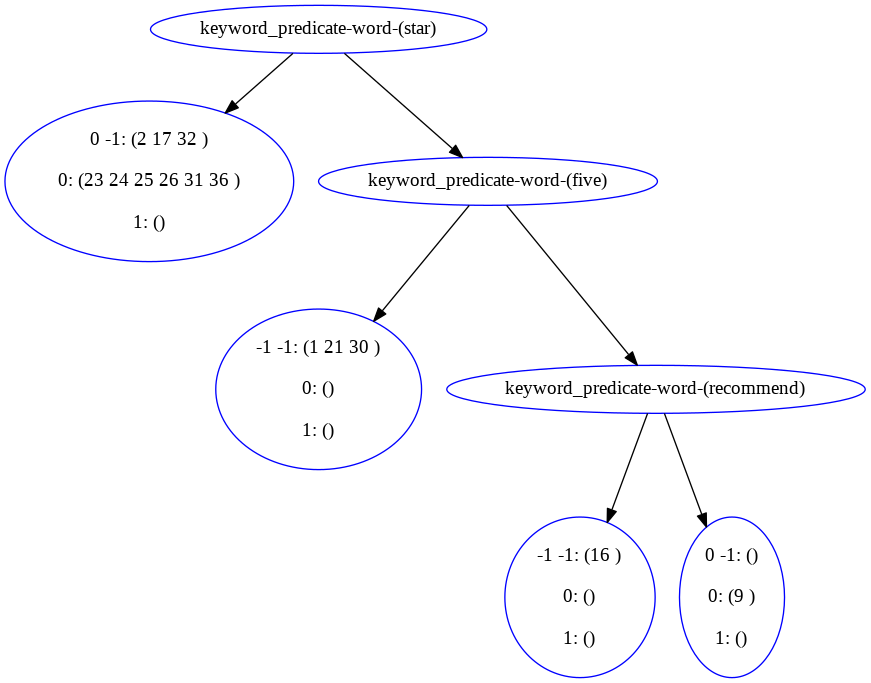



***********************************
the original tree now becomes: 


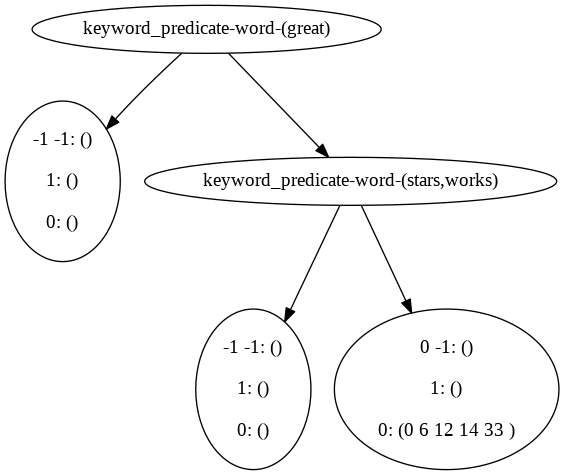

-----------------------------------------------------
original tree 4


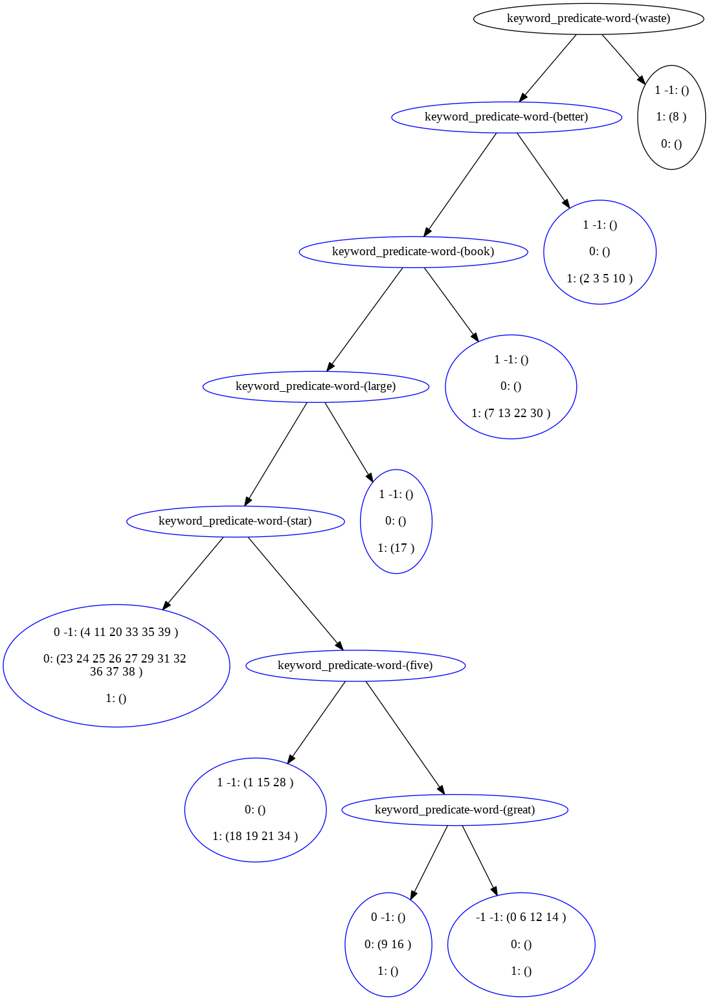

current queue: (keyword_predicate-word-(waste), [])
cur_node: keyword_predicate-word-(waste), rancestors: []


current queue: (keyword_predicate-word-(better), [])
cur_node: keyword_predicate-word-(better), rancestors: []


current queue: (keyword_predicate-word-(book), [])
cur_node: keyword_predicate-word-(book), rancestors: []


current queue: (keyword_predicate-word-(large), [])
cur_node: keyword_predicate-word-(large), rancestors: []


current queue: (keyword_predicate-word-(star), [])
cur_node: keyword_predicate-word-(star), rancestors: []
current queue: (keyword_predicate-word-(five), [keyword_predicate-word-(star)])
cur_node: keyword_predicate-word-(five), rancestors: [keyword_predicate-word-(star)]
current queue: (keyword_predicate-word-(great), [keyword_predicate-word-(star), keyword_predicate-word-(five)])
cur_node: keyword_predicate-word-(great), rancestors: [keyword_predicate-word-(star), keyword_predicate-word-(five)]
new trees from cur rule:
[PredicateNode(id=1, pred=keyw

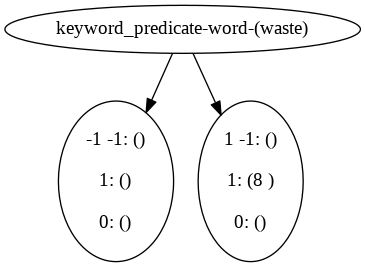

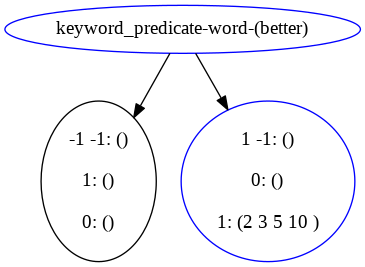

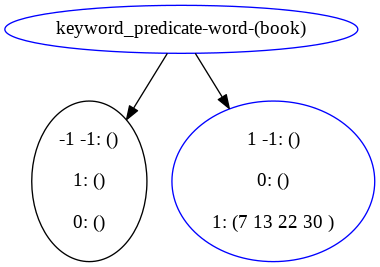

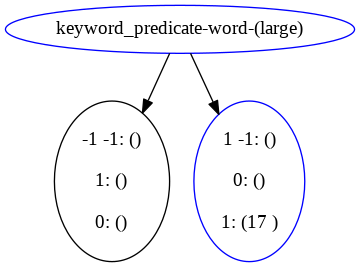

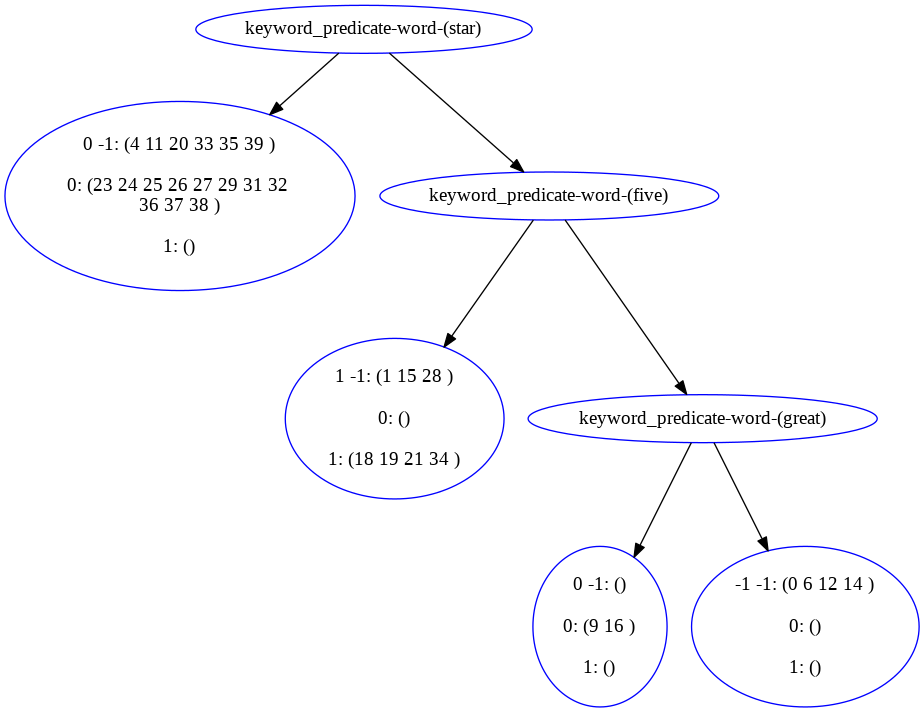



***********************************
the original tree now becomes: 


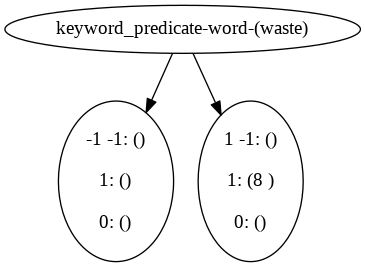

-----------------------------------------------------
original tree 5


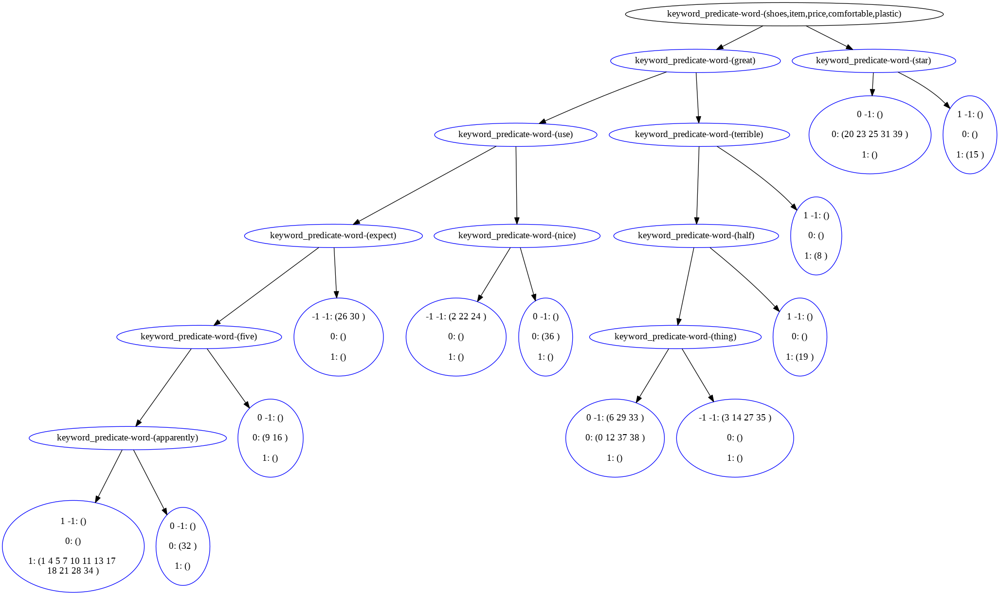

current queue: (keyword_predicate-word-(shoes,item,price,comfortable,plastic), [])
cur_node: keyword_predicate-word-(shoes,item,price,comfortable,plastic), rancestors: []


current queue: (keyword_predicate-word-(great), [])
cur_node: keyword_predicate-word-(great), rancestors: []


current queue: (keyword_predicate-word-(star), [keyword_predicate-word-(shoes,item,price,comfortable,plastic)])
cur_node: keyword_predicate-word-(star), rancestors: [keyword_predicate-word-(shoes,item,price,comfortable,plastic)]
current queue: (keyword_predicate-word-(use), [])
cur_node: keyword_predicate-word-(use), rancestors: []


current queue: (keyword_predicate-word-(terrible), [keyword_predicate-word-(great)])
cur_node: keyword_predicate-word-(terrible), rancestors: [keyword_predicate-word-(great)]


current queue: (keyword_predicate-word-(expect), [])
cur_node: keyword_predicate-word-(expect), rancestors: []


current queue: (keyword_predicate-word-(nice), [keyword_predicate-word-(use)])
cur_node: k

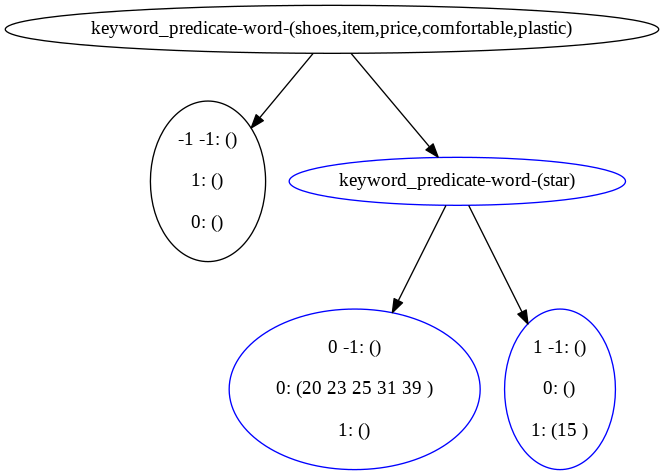

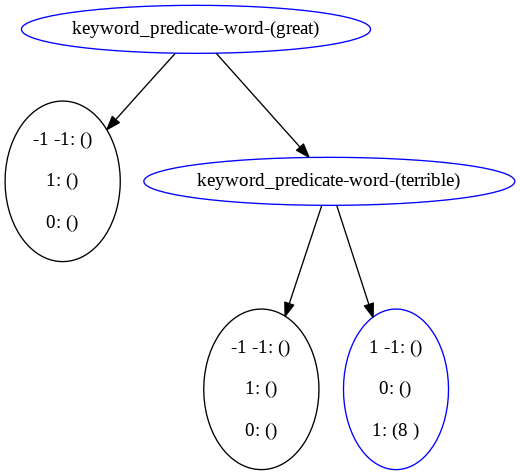

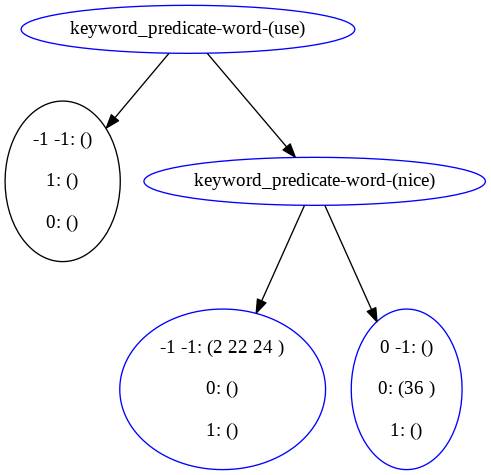

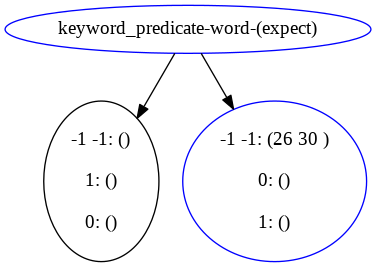

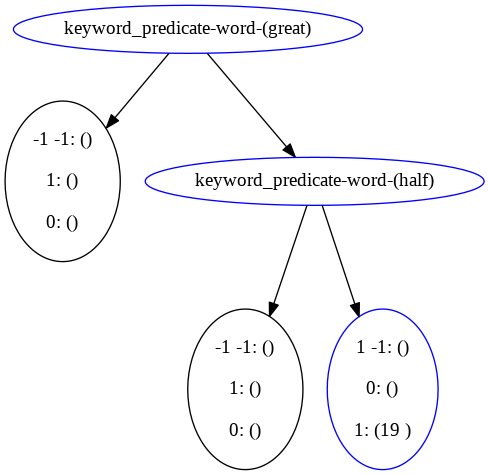

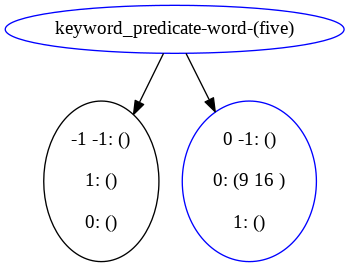

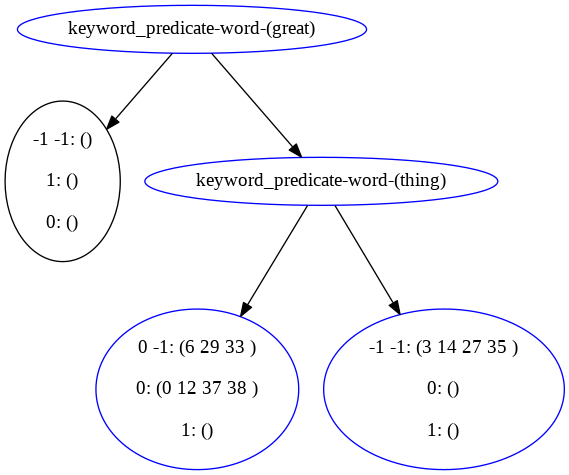

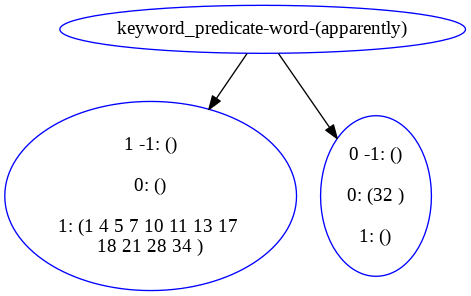



***********************************
the original tree now becomes: 


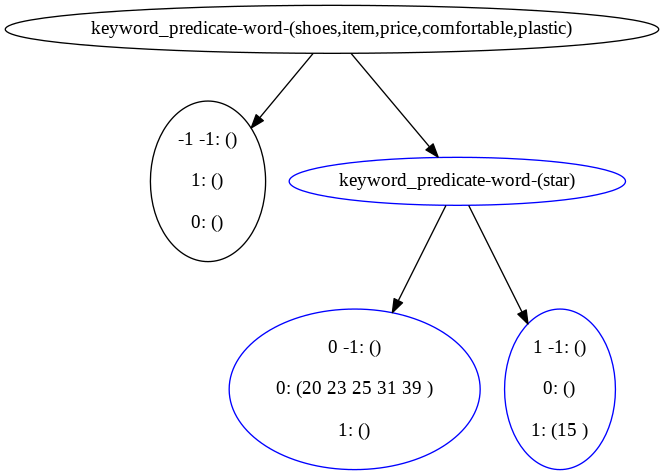

-----------------------------------------------------
original tree 6


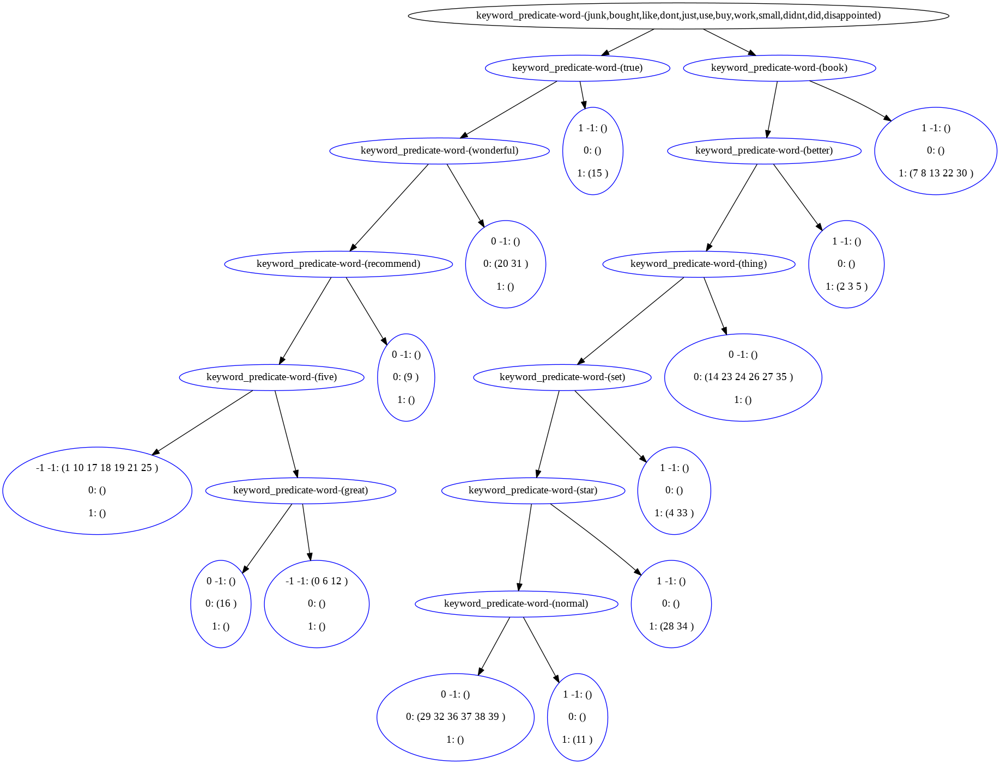

current queue: (keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed), [])
cur_node: keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed), rancestors: []


current queue: (keyword_predicate-word-(true), [])
cur_node: keyword_predicate-word-(true), rancestors: []


current queue: (keyword_predicate-word-(book), [keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed)])
cur_node: keyword_predicate-word-(book), rancestors: [keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed)]


current queue: (keyword_predicate-word-(wonderful), [])
cur_node: keyword_predicate-word-(wonderful), rancestors: []


current queue: (keyword_predicate-word-(better), [keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed)])
cur_node: keyword_predicate-word-(better), rancestors: [keyword_predicate-word-(junk,bought,li

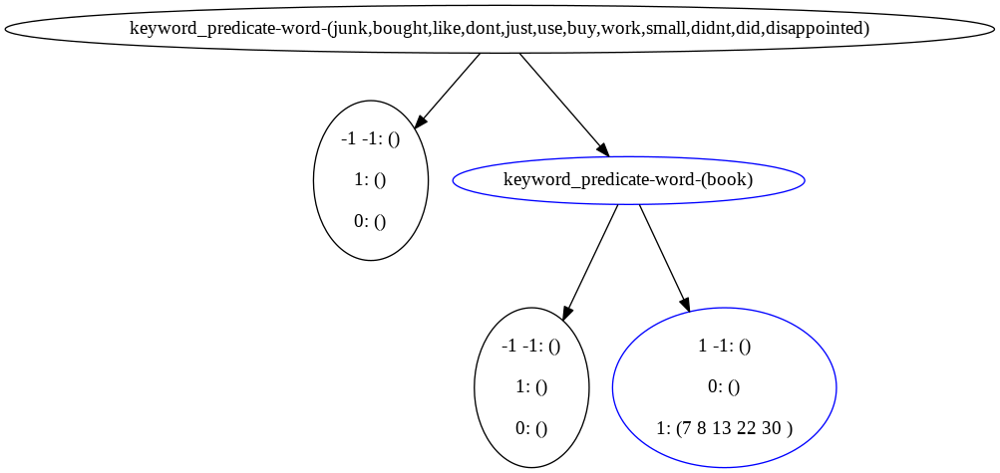

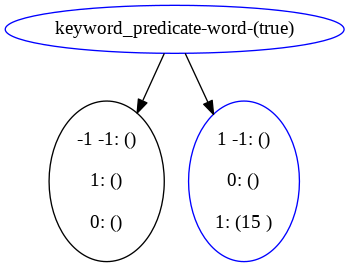

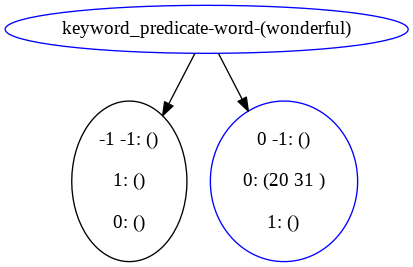

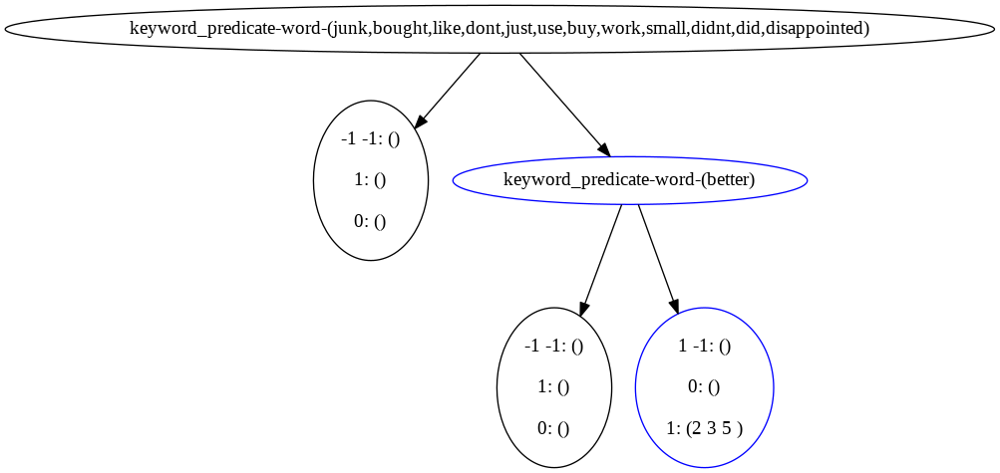

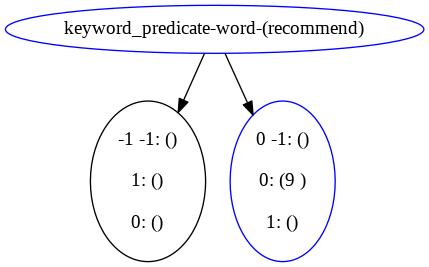

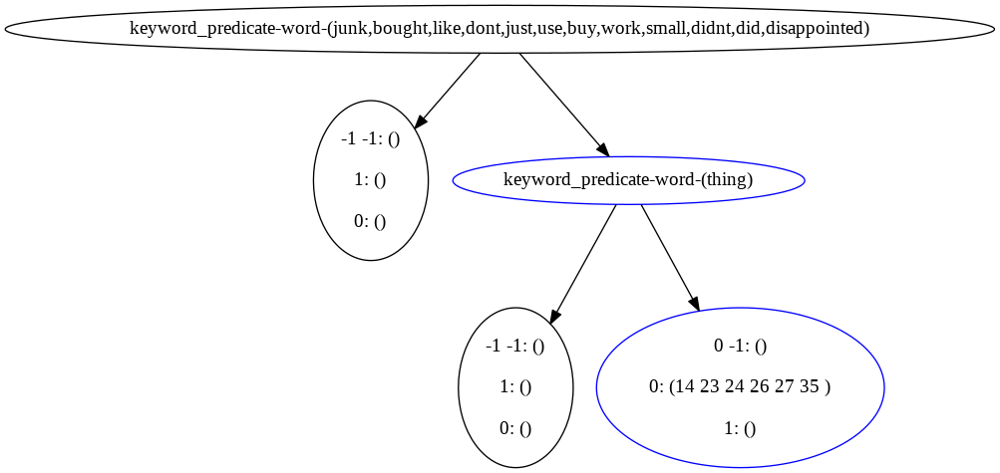

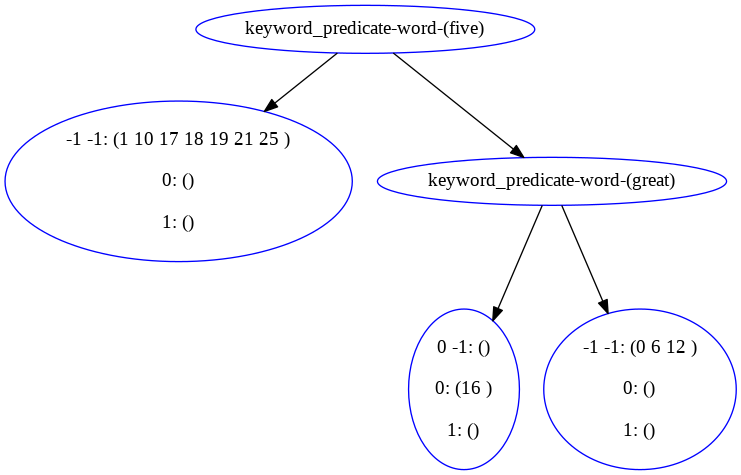

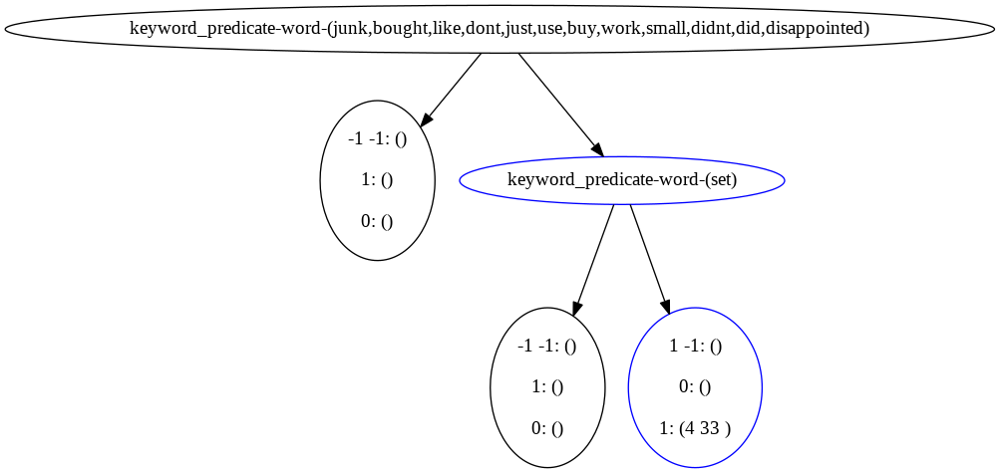

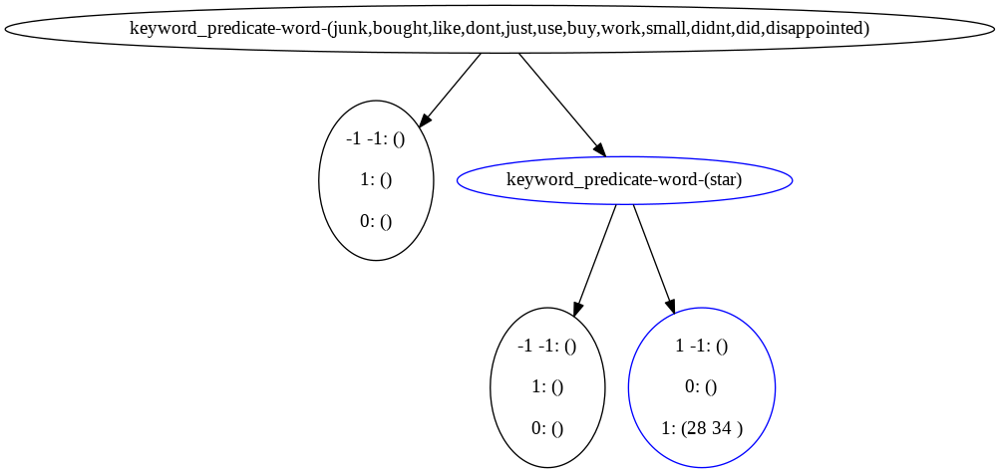

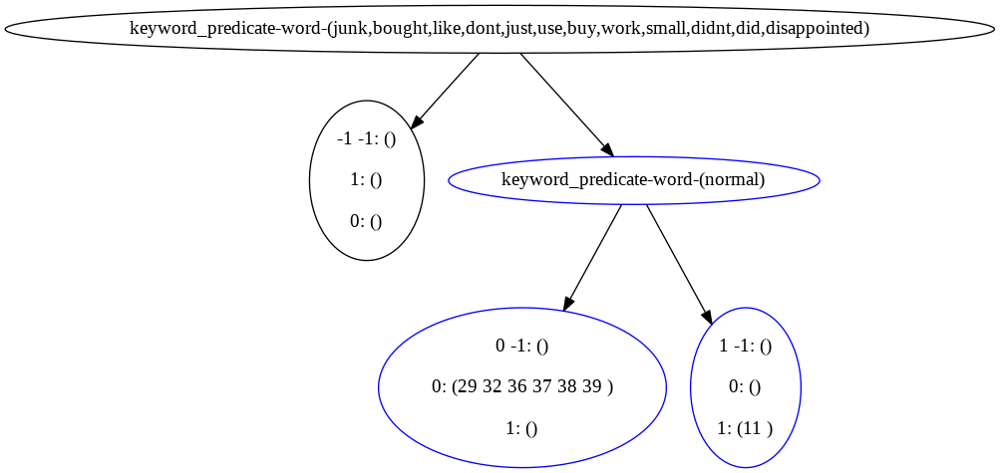



***********************************
the original tree now becomes: 


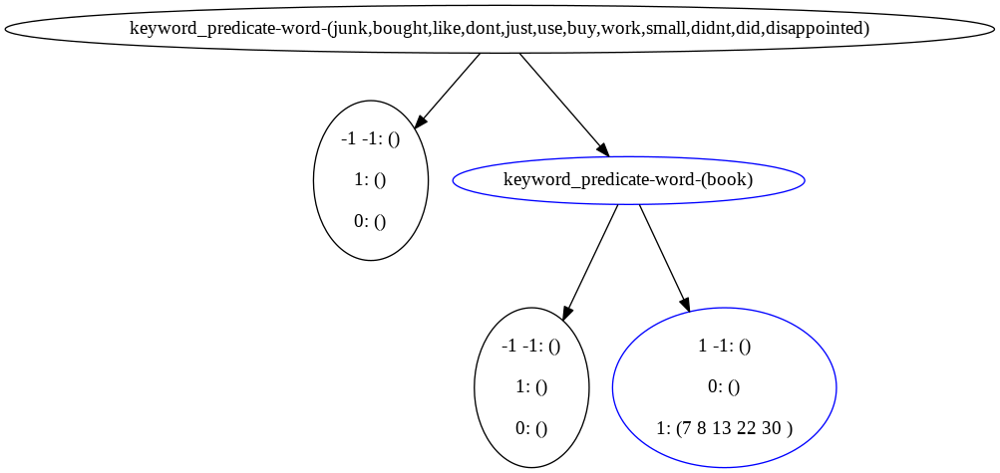

-----------------------------------------------------
original tree 7


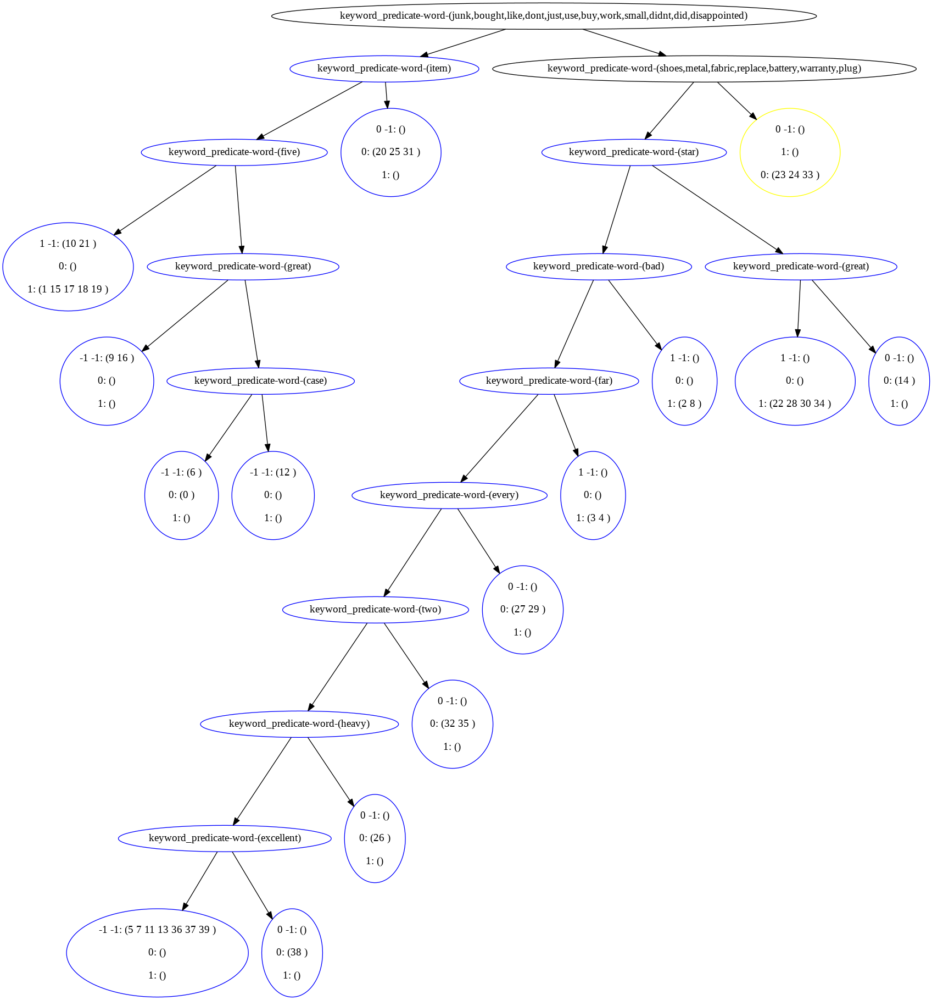

current queue: (keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed), [])
cur_node: keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed), rancestors: []


current queue: (keyword_predicate-word-(item), [])
cur_node: keyword_predicate-word-(item), rancestors: []


current queue: (keyword_predicate-word-(shoes,metal,fabric,replace,battery,warranty,plug), [keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed)])
cur_node: keyword_predicate-word-(shoes,metal,fabric,replace,battery,warranty,plug), rancestors: [keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed)]


current queue: (keyword_predicate-word-(five), [])
cur_node: keyword_predicate-word-(five), rancestors: []
current queue: (keyword_predicate-word-(star), [keyword_predicate-word-(junk,bought,like,dont,just,use,buy,work,small,didnt,did,disappointed)])
cur_node: keyword_pr

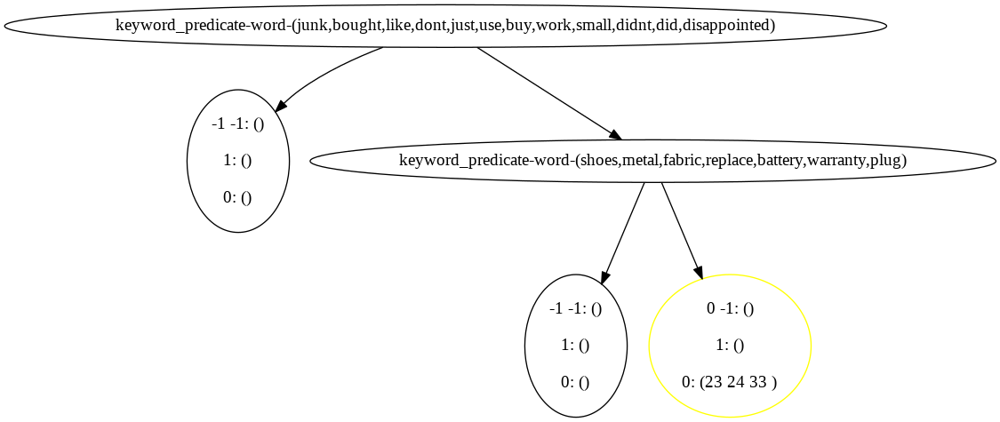

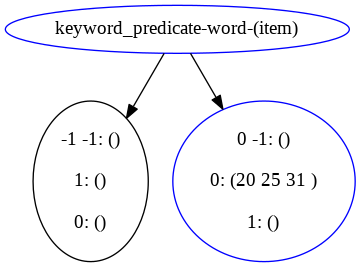

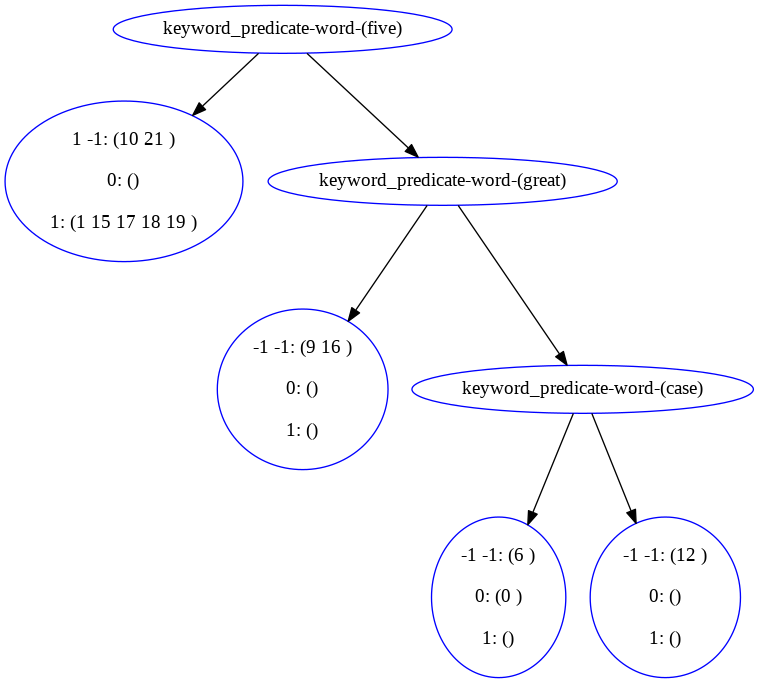

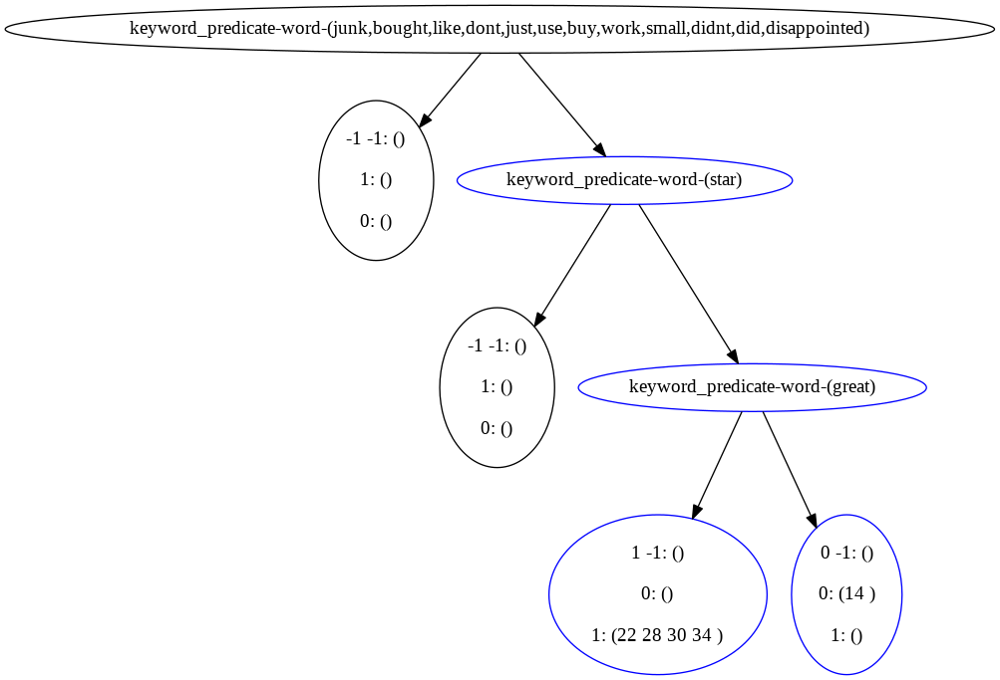

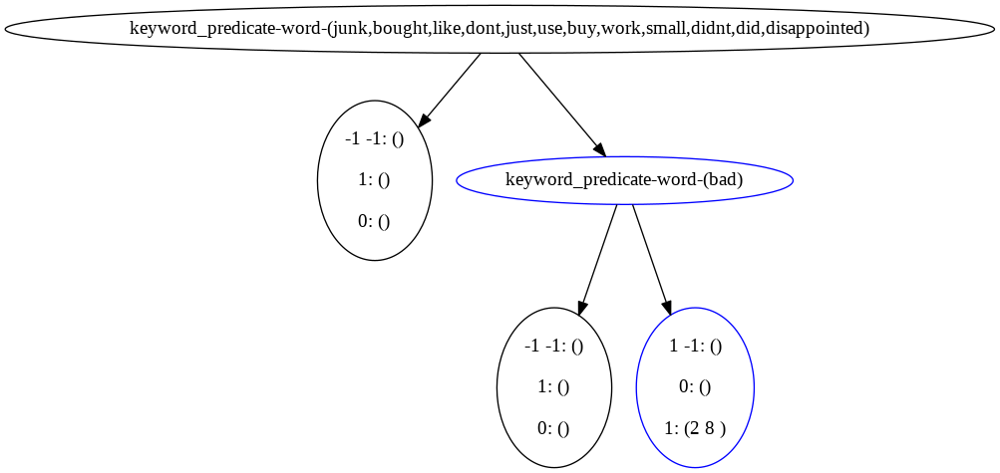

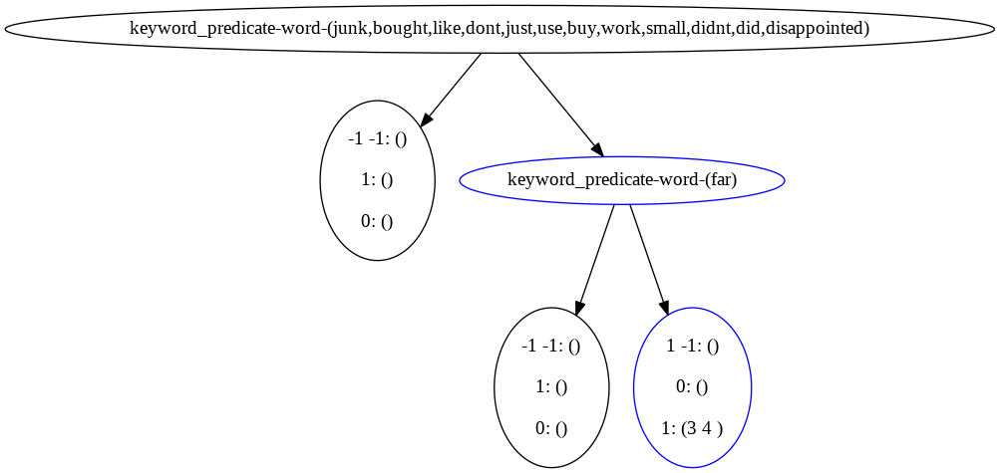

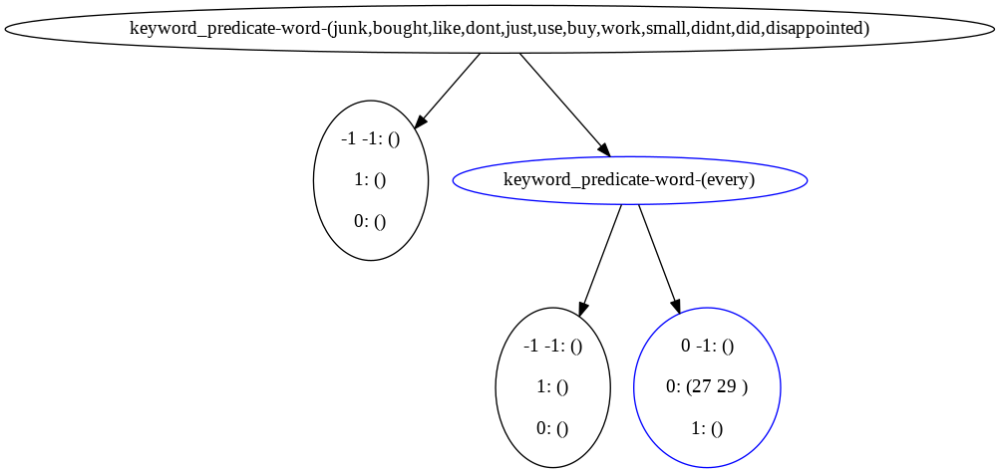

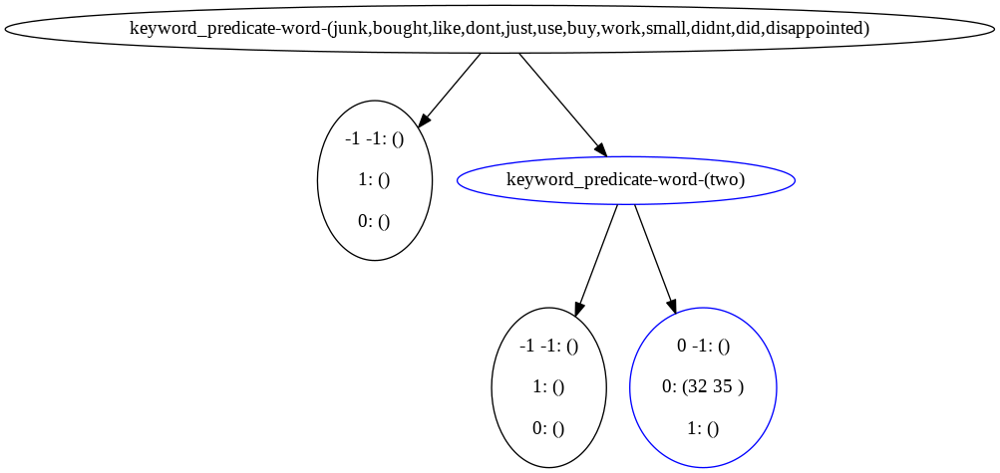

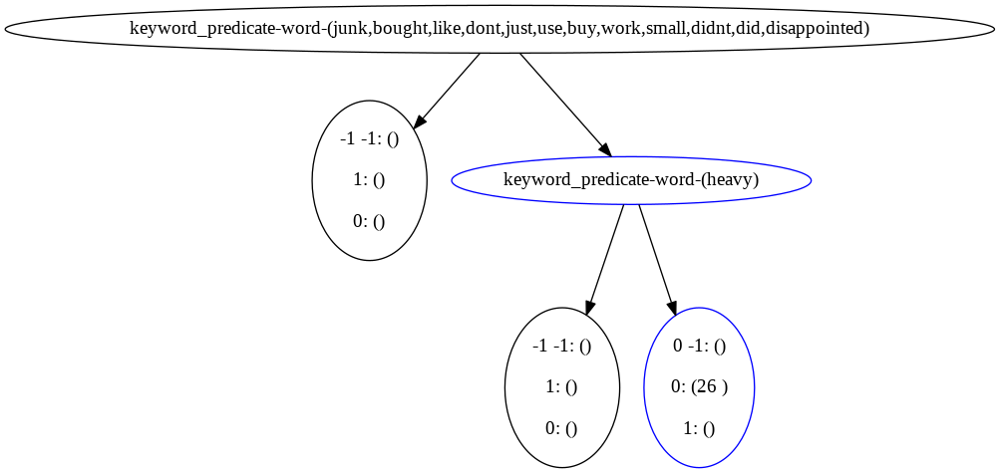

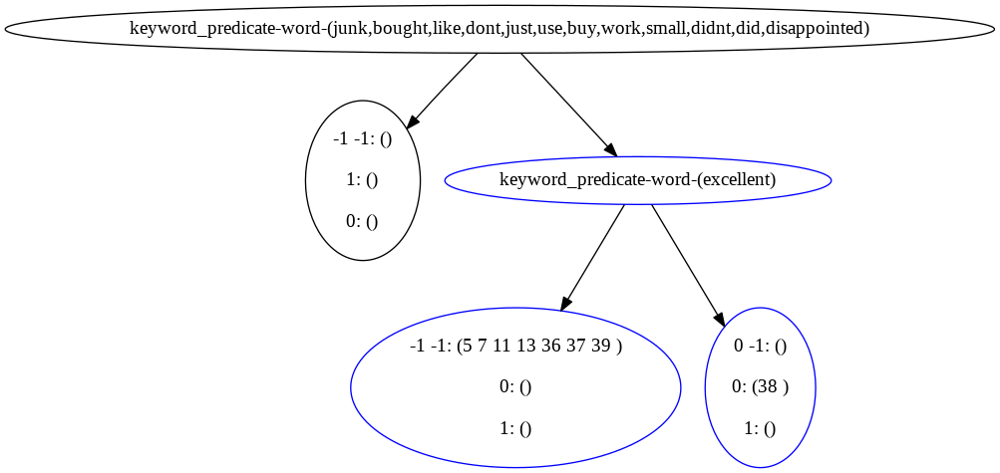



***********************************
the original tree now becomes: 


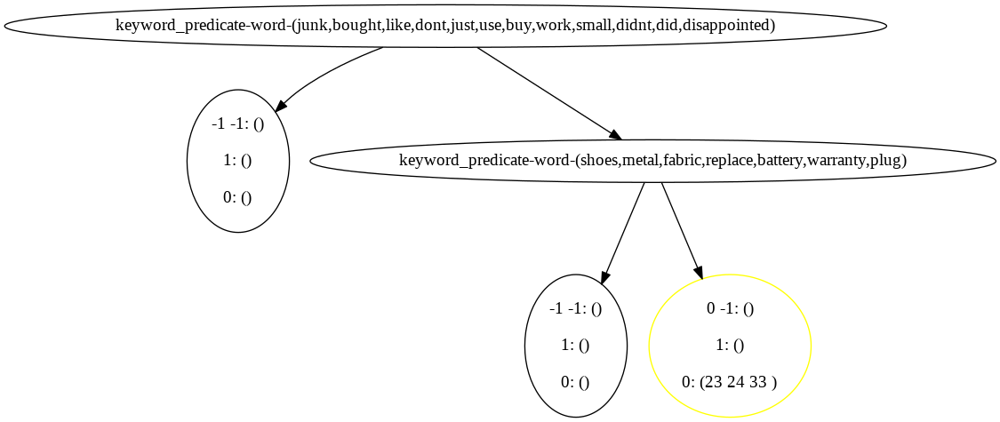

-----------------------------------------------------
original tree 8


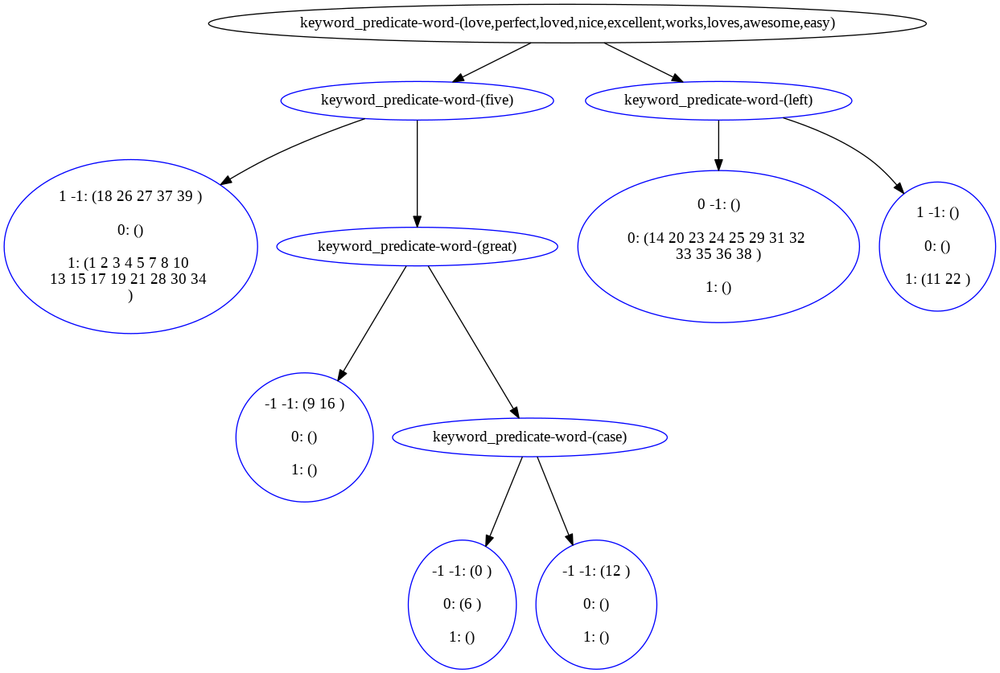

current queue: (keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy), [])
cur_node: keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy), rancestors: []


current queue: (keyword_predicate-word-(five), [])
cur_node: keyword_predicate-word-(five), rancestors: []
current queue: (keyword_predicate-word-(left), [keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy)])
cur_node: keyword_predicate-word-(left), rancestors: [keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy)]
current queue: (keyword_predicate-word-(great), [keyword_predicate-word-(five)])
cur_node: keyword_predicate-word-(great), rancestors: [keyword_predicate-word-(five)]
current queue: (keyword_predicate-word-(case), [keyword_predicate-word-(five), keyword_predicate-word-(great)])
cur_node: keyword_predicate-word-(case), rancestors: [keyword_predicate-word-(five), keyword_predicate-word-(great)]
new tre

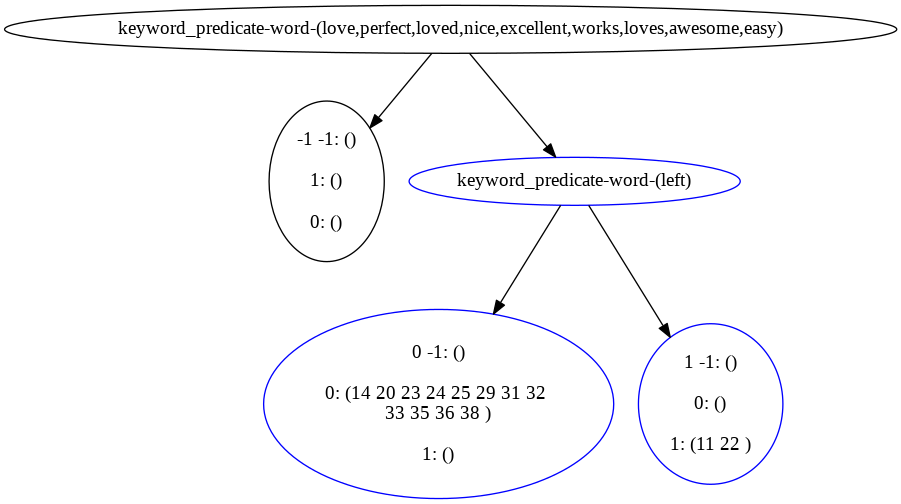

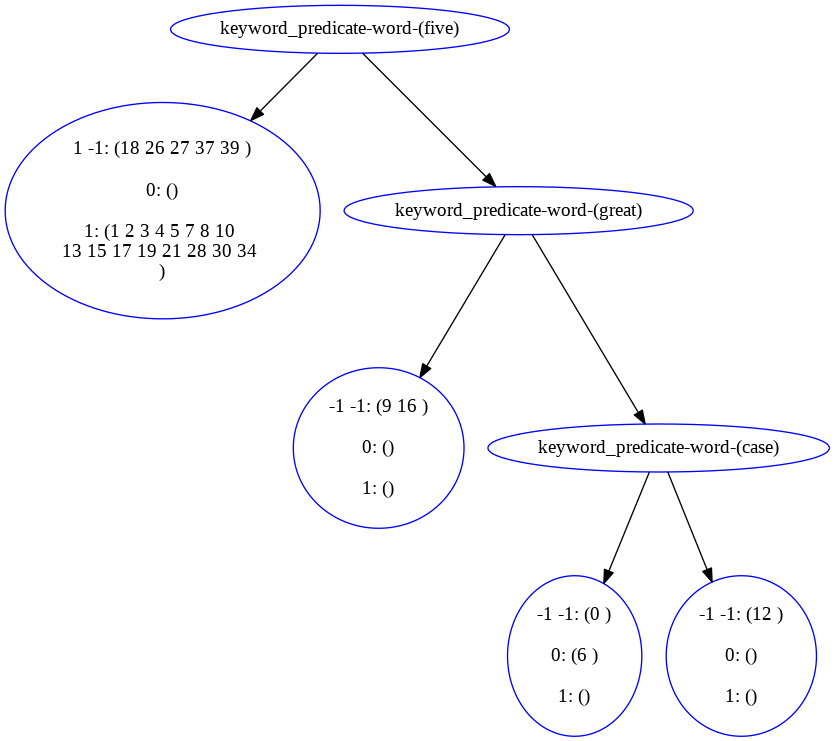



***********************************
the original tree now becomes: 


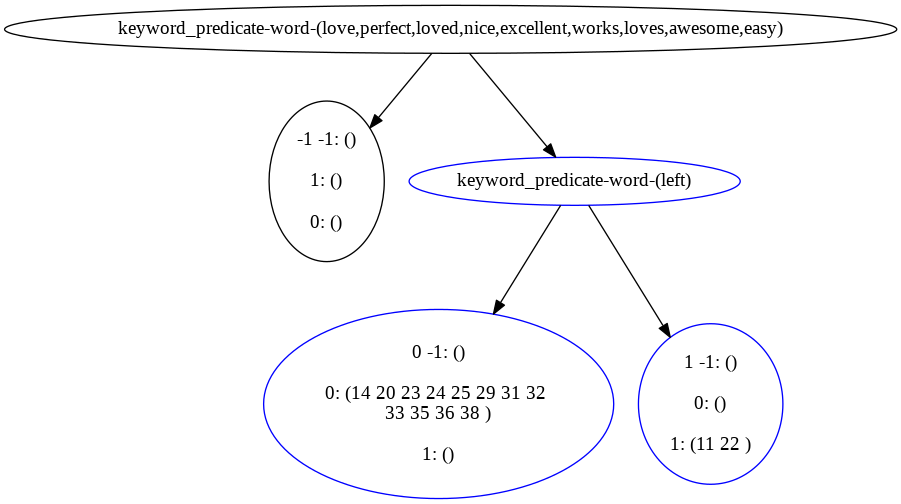

-----------------------------------------------------
original tree 9


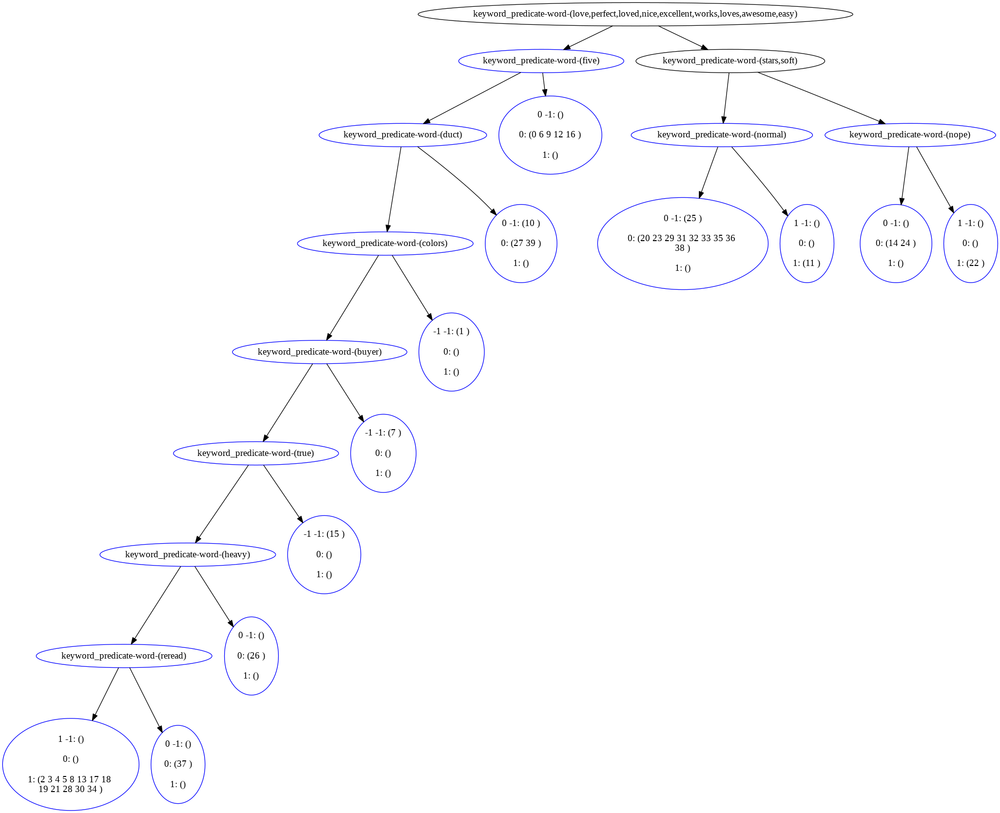

current queue: (keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy), [])
cur_node: keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy), rancestors: []


current queue: (keyword_predicate-word-(five), [])
cur_node: keyword_predicate-word-(five), rancestors: []


current queue: (keyword_predicate-word-(stars,soft), [keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy)])
cur_node: keyword_predicate-word-(stars,soft), rancestors: [keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy)]


current queue: (keyword_predicate-word-(duct), [])
cur_node: keyword_predicate-word-(duct), rancestors: []


current queue: (keyword_predicate-word-(normal), [keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy)])
cur_node: keyword_predicate-word-(normal), rancestors: [keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy)]
c

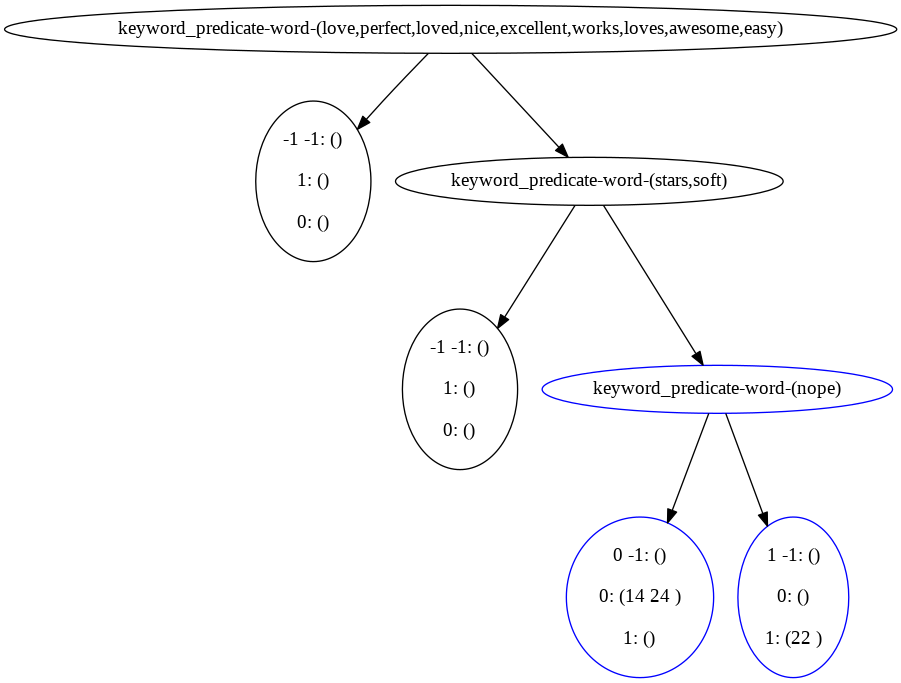

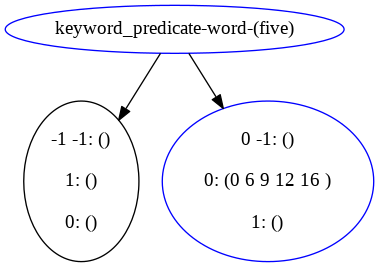

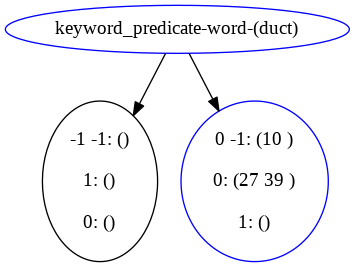

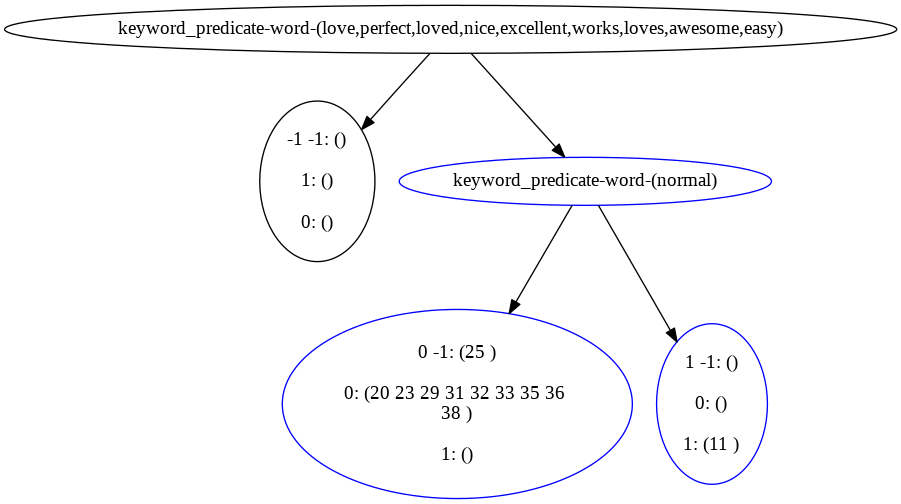

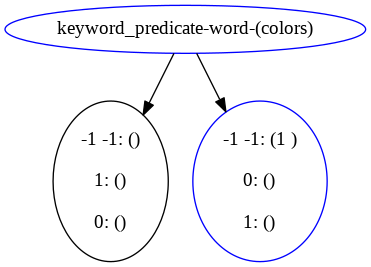

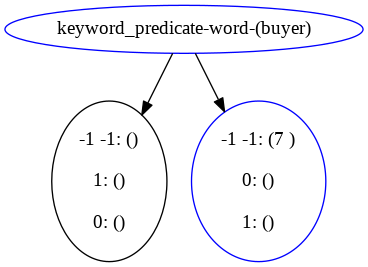

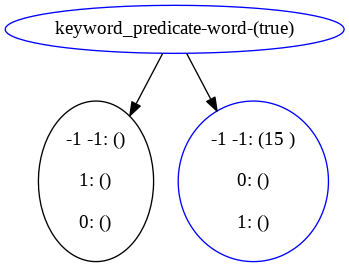

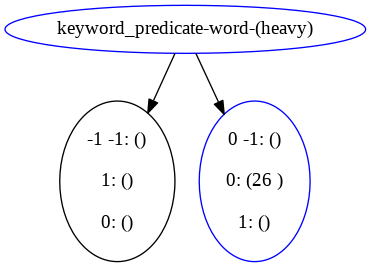

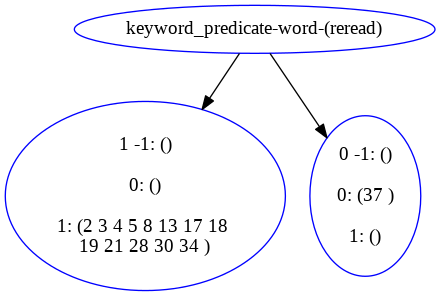



***********************************
the original tree now becomes: 


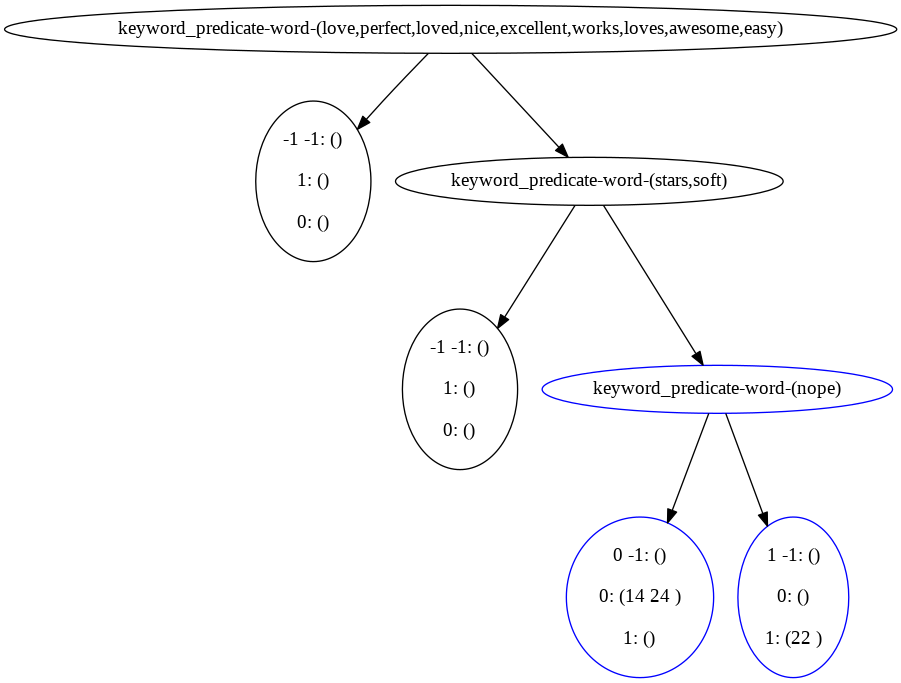

-----------------------------------------------------
original tree 10


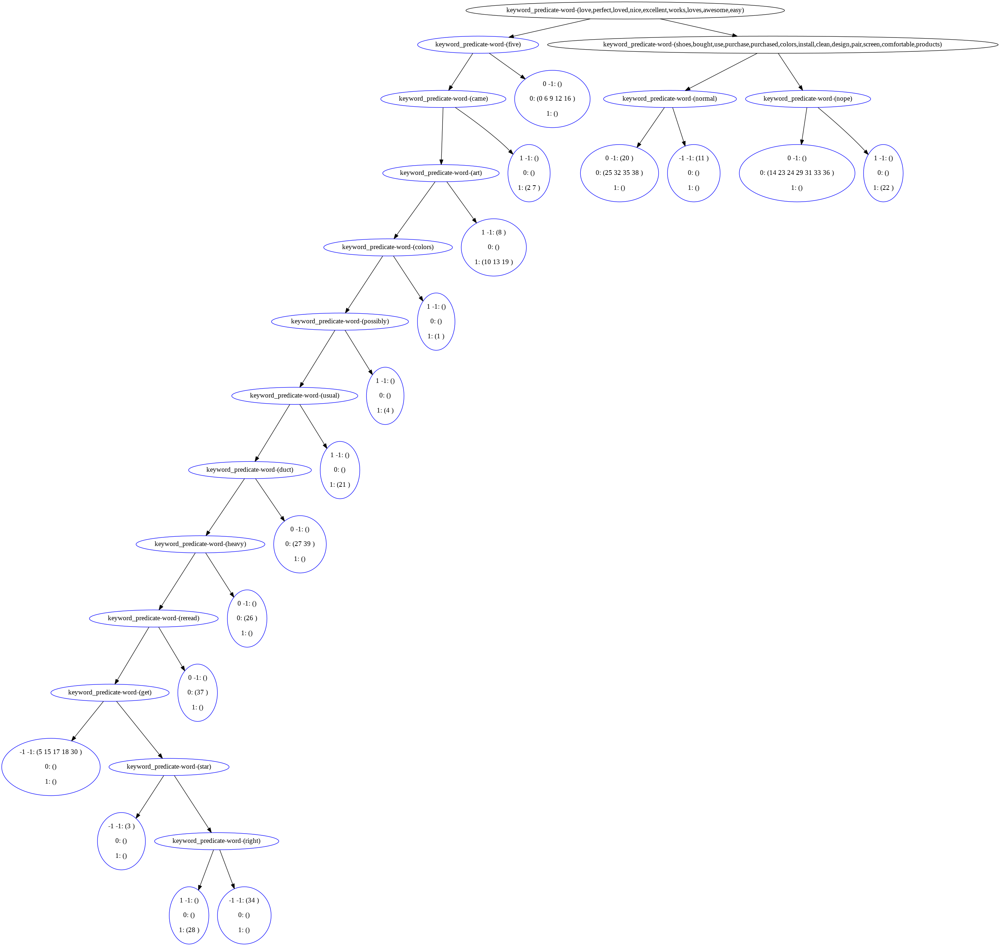

current queue: (keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy), [])
cur_node: keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy), rancestors: []


current queue: (keyword_predicate-word-(five), [])
cur_node: keyword_predicate-word-(five), rancestors: []


current queue: (keyword_predicate-word-(shoes,bought,use,purchase,purchased,colors,install,clean,design,pair,screen,comfortable,products), [keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy)])
cur_node: keyword_predicate-word-(shoes,bought,use,purchase,purchased,colors,install,clean,design,pair,screen,comfortable,products), rancestors: [keyword_predicate-word-(love,perfect,loved,nice,excellent,works,loves,awesome,easy)]


current queue: (keyword_predicate-word-(came), [])
cur_node: keyword_predicate-word-(came), rancestors: []


current queue: (keyword_predicate-word-(normal), [keyword_predicate-word-(love,perfect,loved,nice,excellen

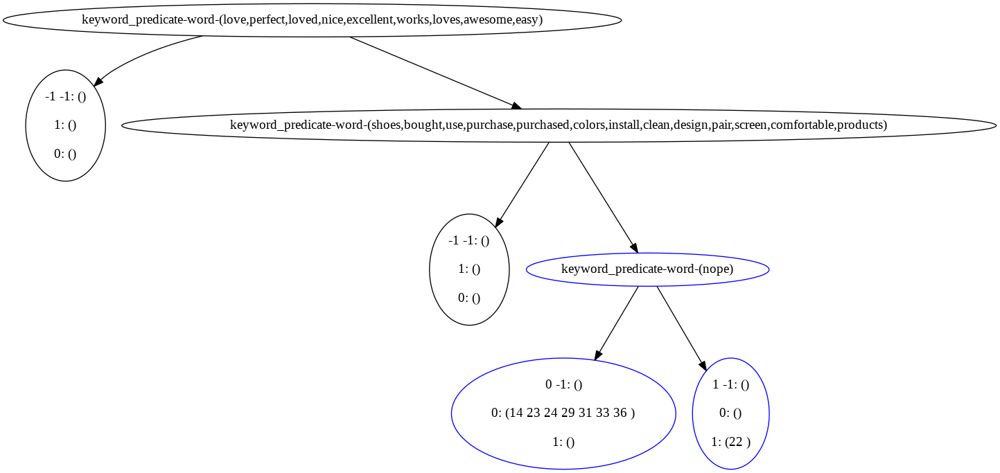

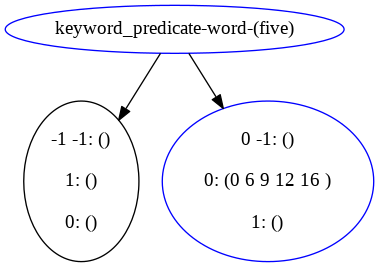

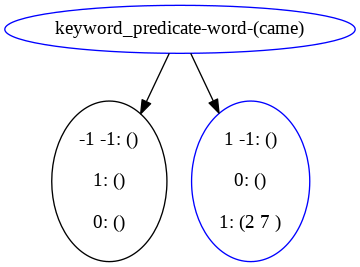

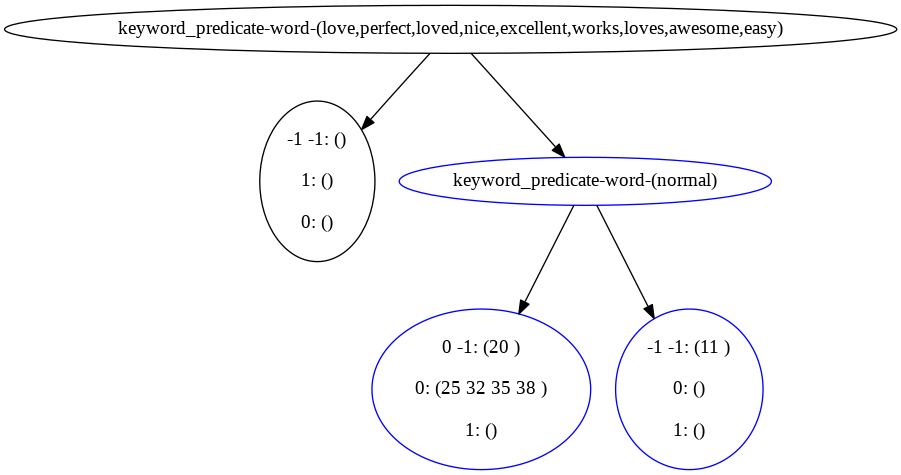

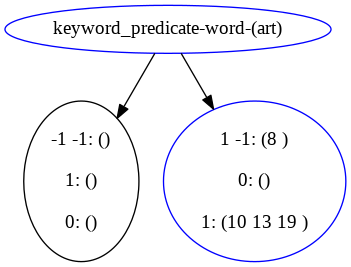

...

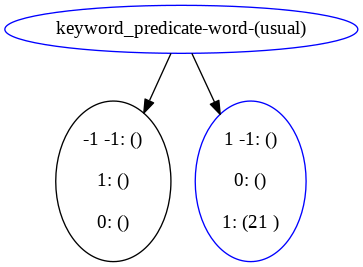

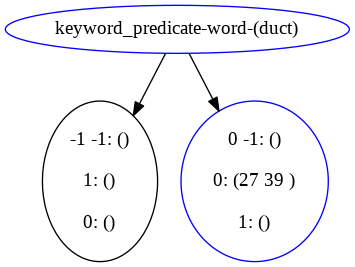

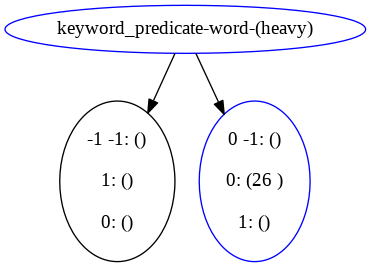

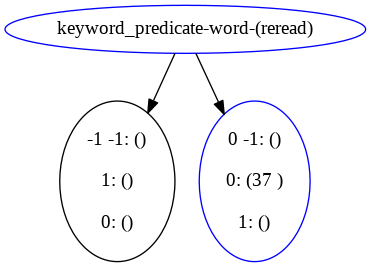

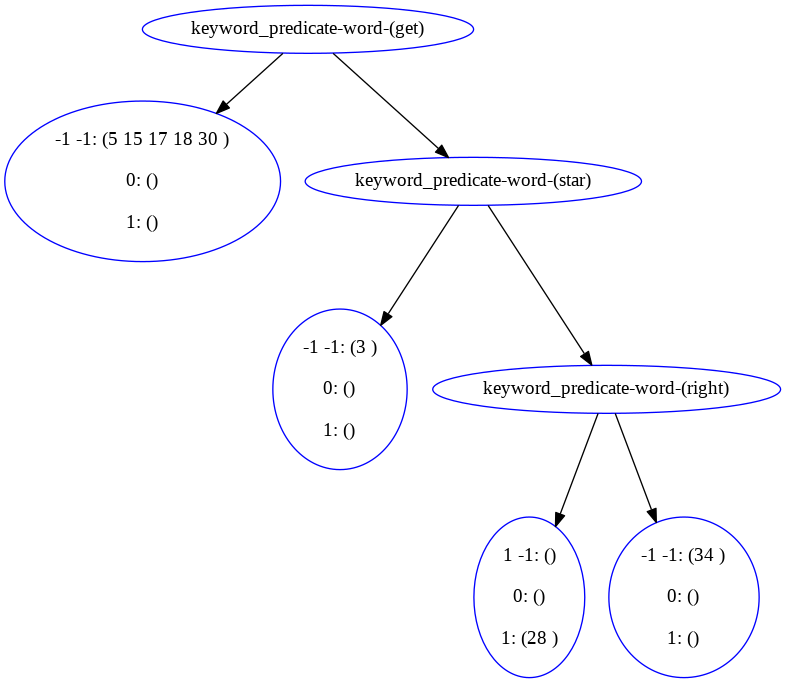



***********************************
the original tree now becomes: 


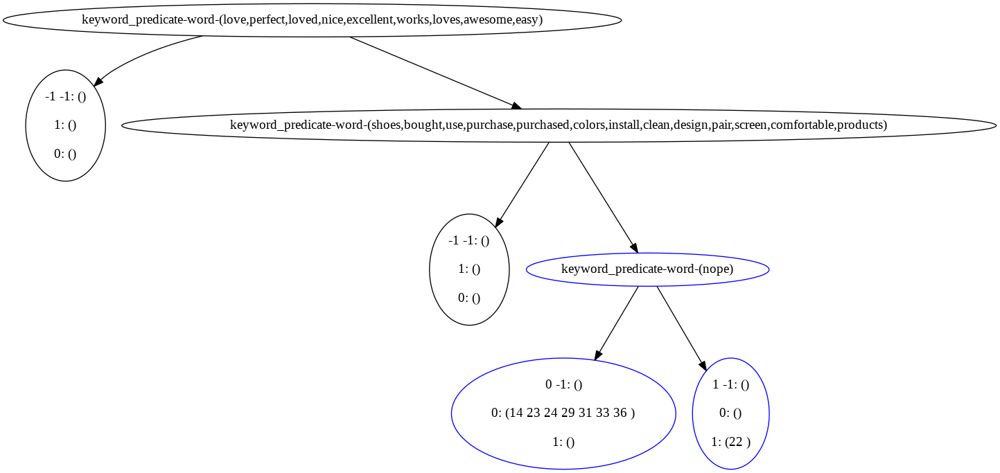

-----------------------------------------------------
original tree 11


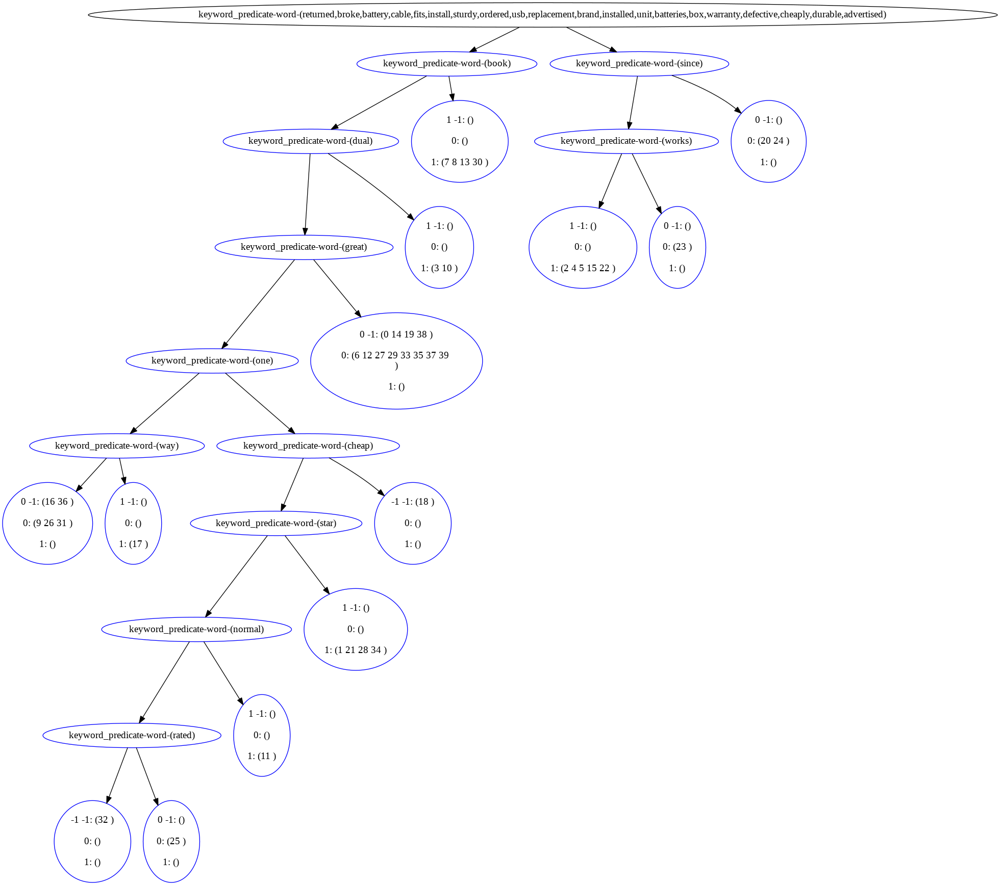

current queue: (keyword_predicate-word-(returned,broke,battery,cable,fits,install,sturdy,ordered,usb,replacement,brand,installed,unit,batteries,box,warranty,defective,cheaply,durable,advertised), [])
cur_node: keyword_predicate-word-(returned,broke,battery,cable,fits,install,sturdy,ordered,usb,replacement,brand,installed,unit,batteries,box,warranty,defective,cheaply,durable,advertised), rancestors: []


current queue: (keyword_predicate-word-(book), [])
cur_node: keyword_predicate-word-(book), rancestors: []


current queue: (keyword_predicate-word-(since), [keyword_predicate-word-(returned,broke,battery,cable,fits,install,sturdy,ordered,usb,replacement,brand,installed,unit,batteries,box,warranty,defective,cheaply,durable,advertised)])
cur_node: keyword_predicate-word-(since), rancestors: [keyword_predicate-word-(returned,broke,battery,cable,fits,install,sturdy,ordered,usb,replacement,brand,installed,unit,batteries,box,warranty,defective,cheaply,durable,advertised)]


current queue: (k

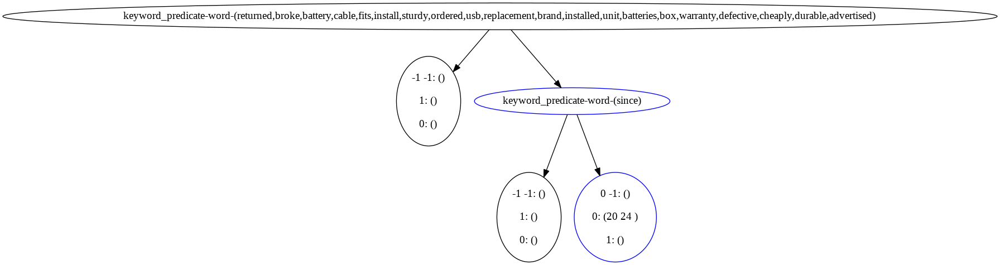

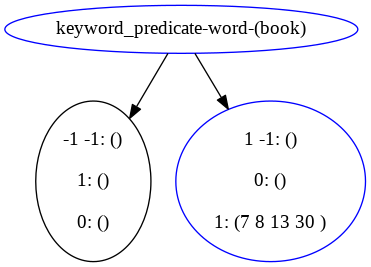

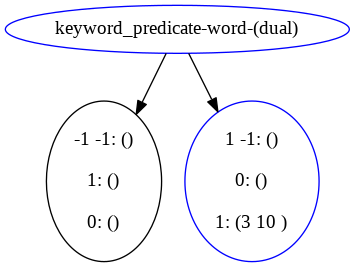

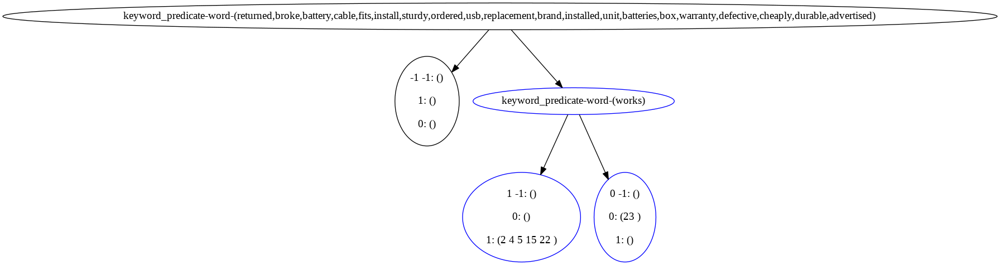

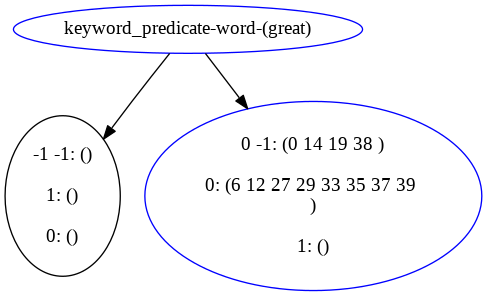

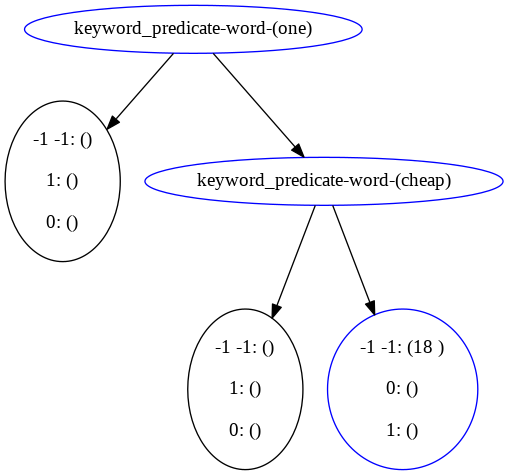

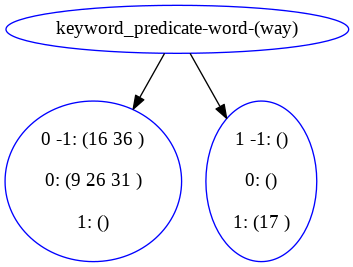

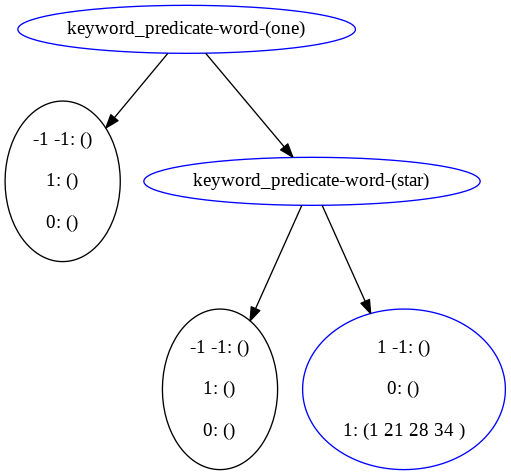

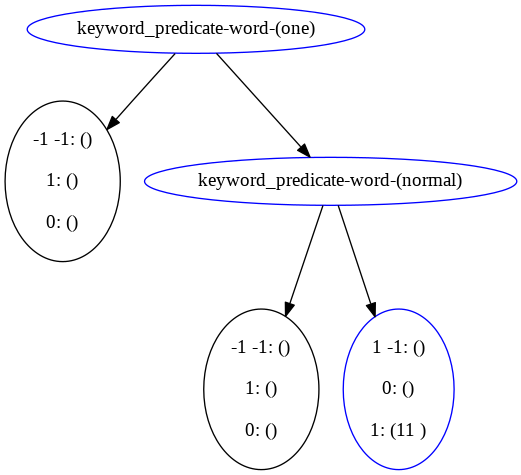

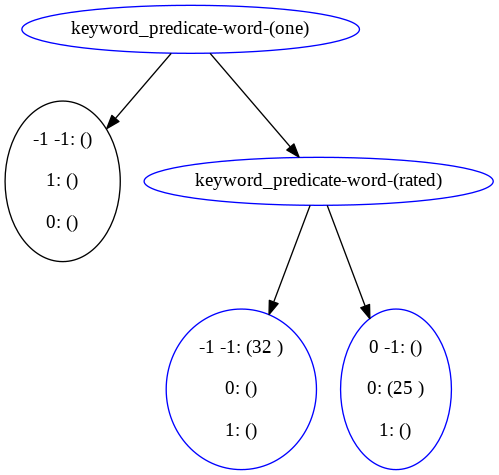



***********************************
the original tree now becomes: 


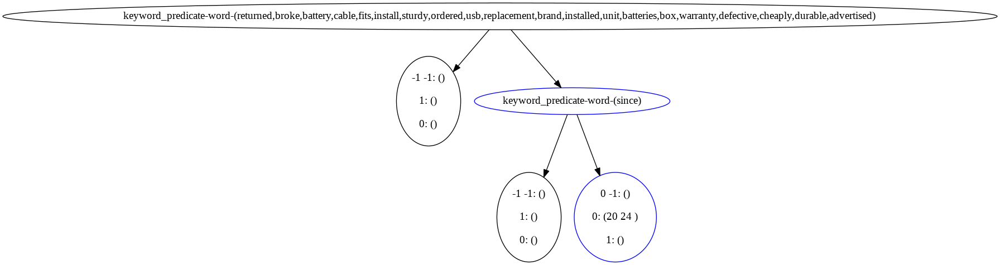

-----------------------------------------------------
original tree 12


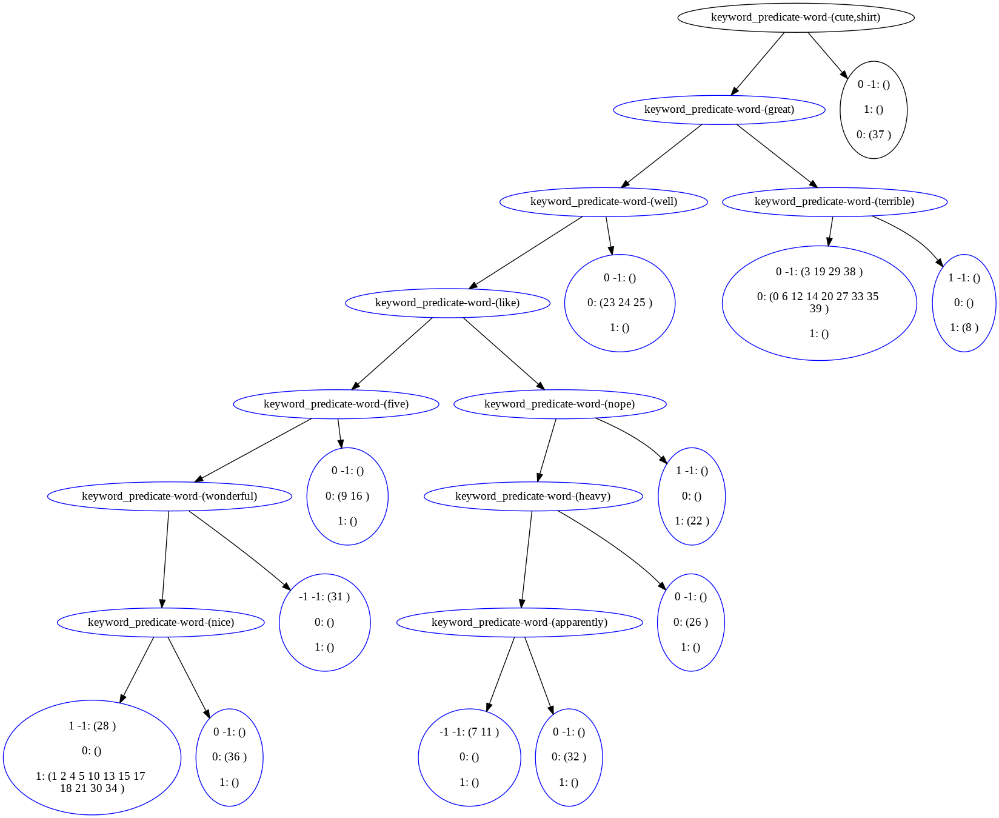

current queue: (keyword_predicate-word-(cute,shirt), [])
cur_node: keyword_predicate-word-(cute,shirt), rancestors: []


current queue: (keyword_predicate-word-(great), [])
cur_node: keyword_predicate-word-(great), rancestors: []


current queue: (keyword_predicate-word-(well), [])
cur_node: keyword_predicate-word-(well), rancestors: []


current queue: (keyword_predicate-word-(terrible), [keyword_predicate-word-(great)])
cur_node: keyword_predicate-word-(terrible), rancestors: [keyword_predicate-word-(great)]
current queue: (keyword_predicate-word-(like), [])
cur_node: keyword_predicate-word-(like), rancestors: []


current queue: (keyword_predicate-word-(five), [])
cur_node: keyword_predicate-word-(five), rancestors: []


current queue: (keyword_predicate-word-(nope), [keyword_predicate-word-(like)])
cur_node: keyword_predicate-word-(nope), rancestors: [keyword_predicate-word-(like)]


current queue: (keyword_predicate-word-(wonderful), [])
cur_node: keyword_predicate-word-(wonderful

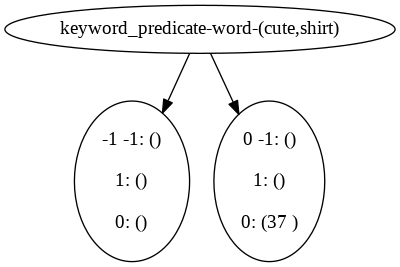

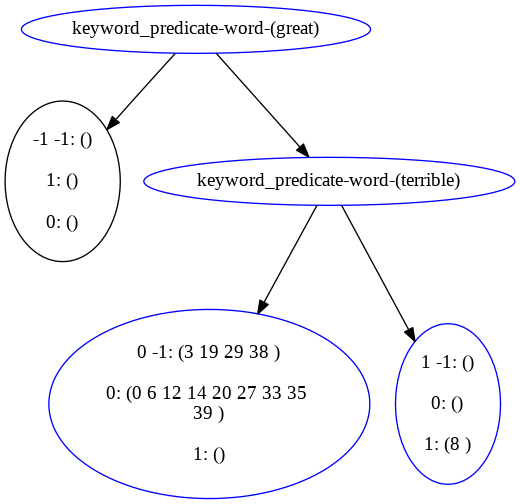

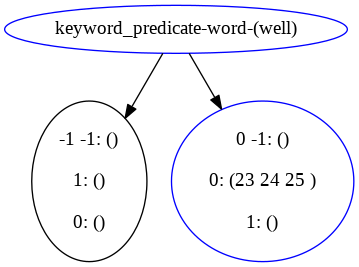

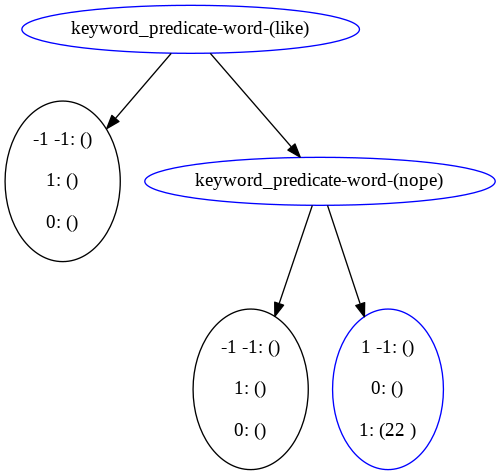

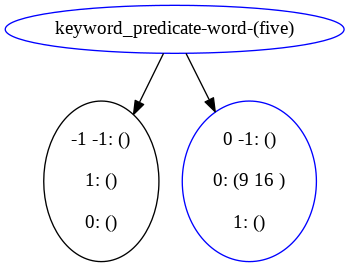

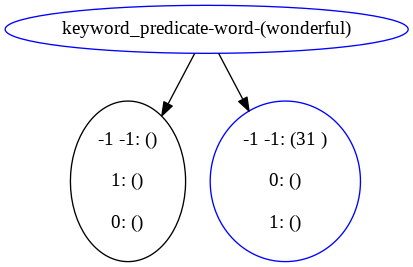

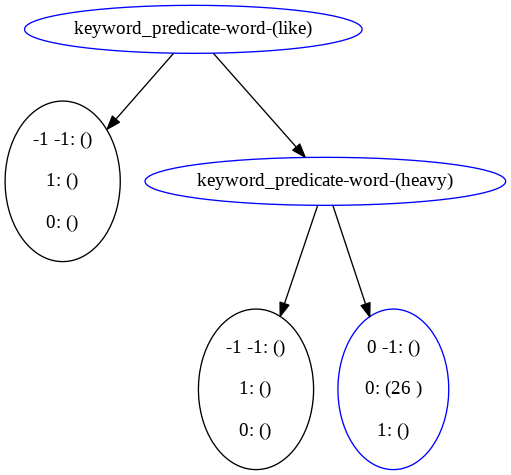

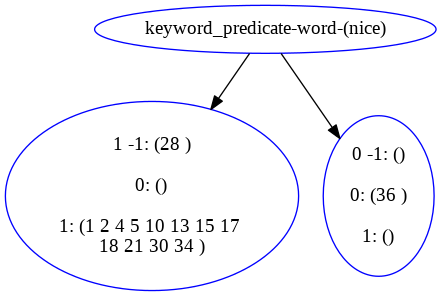

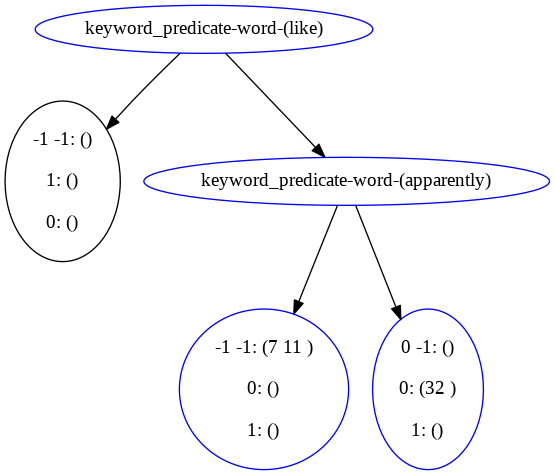



***********************************
the original tree now becomes: 


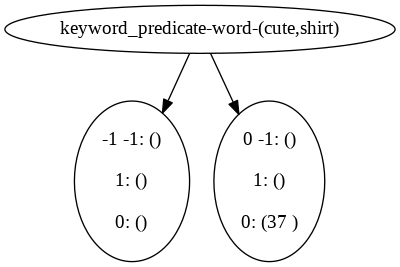

-----------------------------------------------------
original tree 13


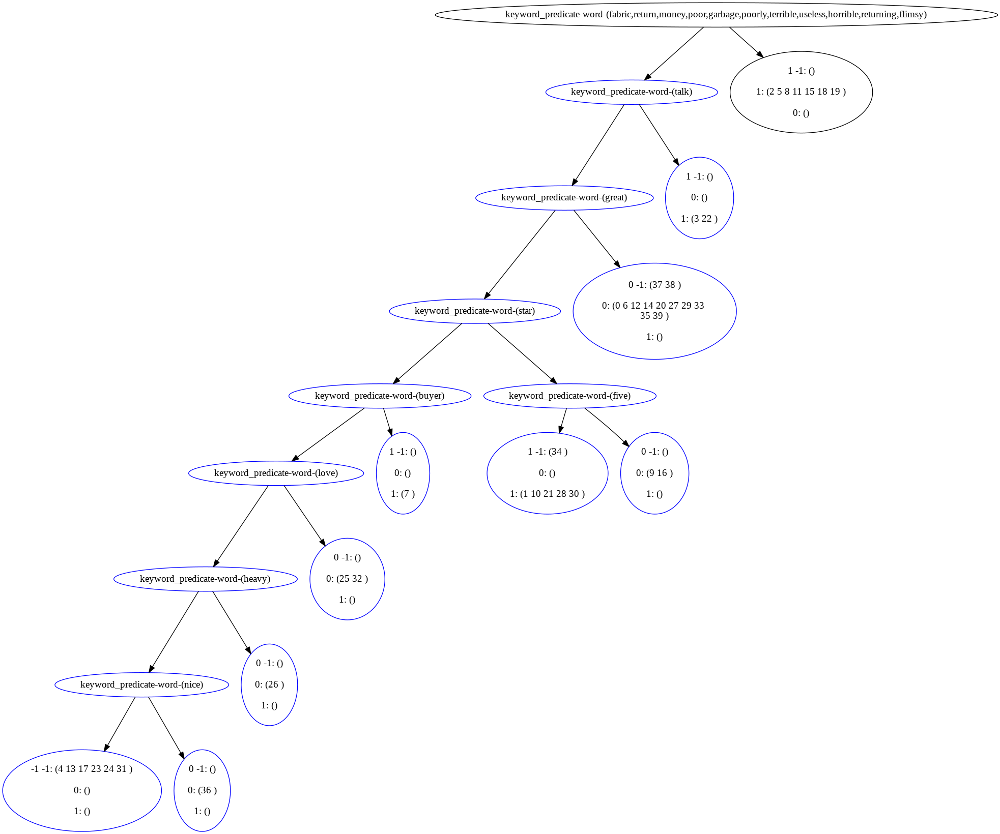

current queue: (keyword_predicate-word-(fabric,return,money,poor,garbage,poorly,terrible,useless,horrible,returning,flimsy), [])
cur_node: keyword_predicate-word-(fabric,return,money,poor,garbage,poorly,terrible,useless,horrible,returning,flimsy), rancestors: []


current queue: (keyword_predicate-word-(talk), [])
cur_node: keyword_predicate-word-(talk), rancestors: []


current queue: (keyword_predicate-word-(great), [])
cur_node: keyword_predicate-word-(great), rancestors: []


current queue: (keyword_predicate-word-(star), [])
cur_node: keyword_predicate-word-(star), rancestors: []


current queue: (keyword_predicate-word-(buyer), [])
cur_node: keyword_predicate-word-(buyer), rancestors: []


current queue: (keyword_predicate-word-(five), [keyword_predicate-word-(star)])
cur_node: keyword_predicate-word-(five), rancestors: [keyword_predicate-word-(star)]
current queue: (keyword_predicate-word-(love), [])
cur_node: keyword_predicate-word-(love), rancestors: []


current queue: (keywo

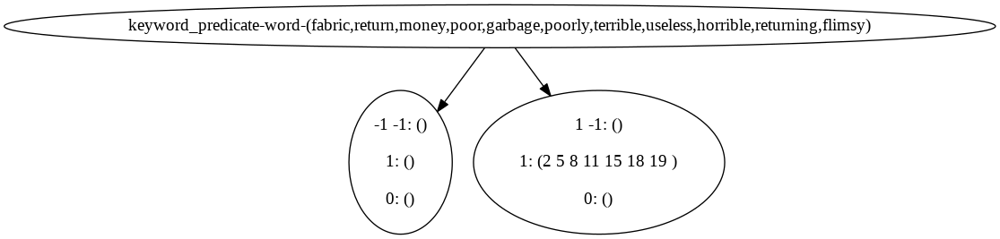

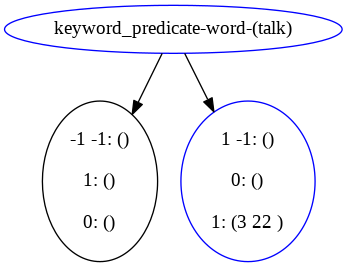

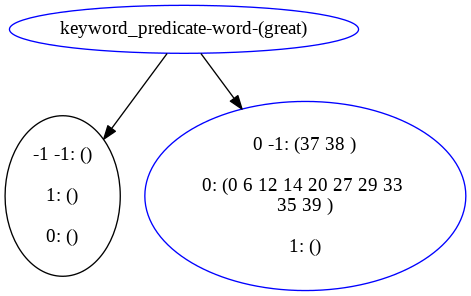

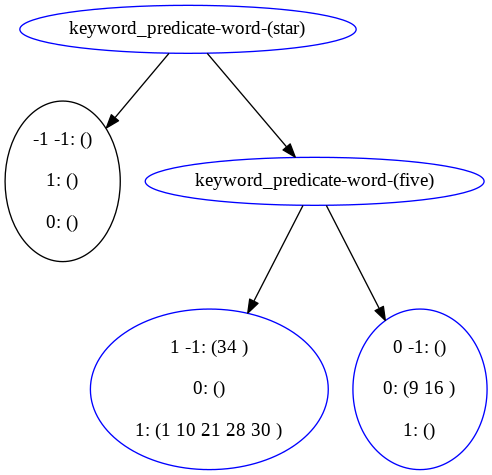

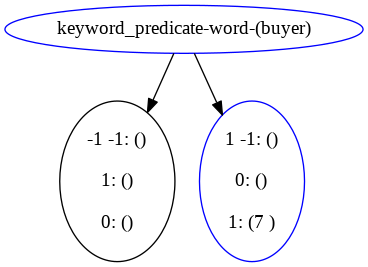

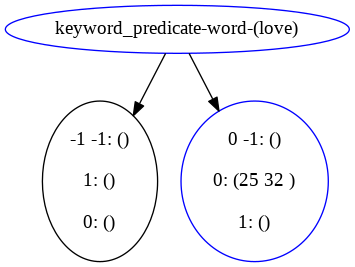

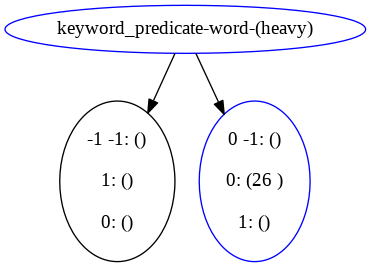

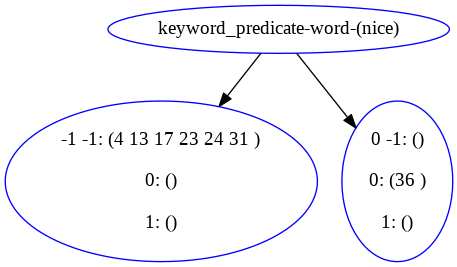



***********************************
the original tree now becomes: 


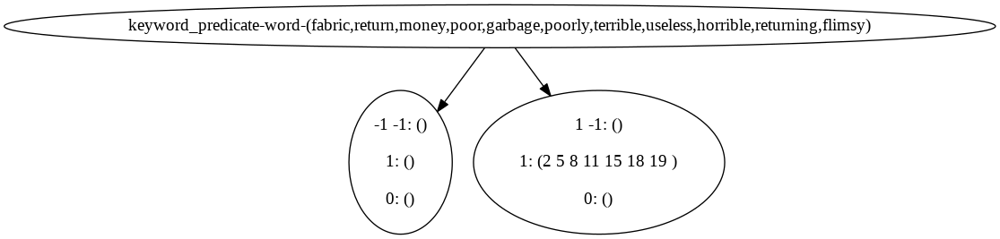

-----------------------------------------------------
original tree 14


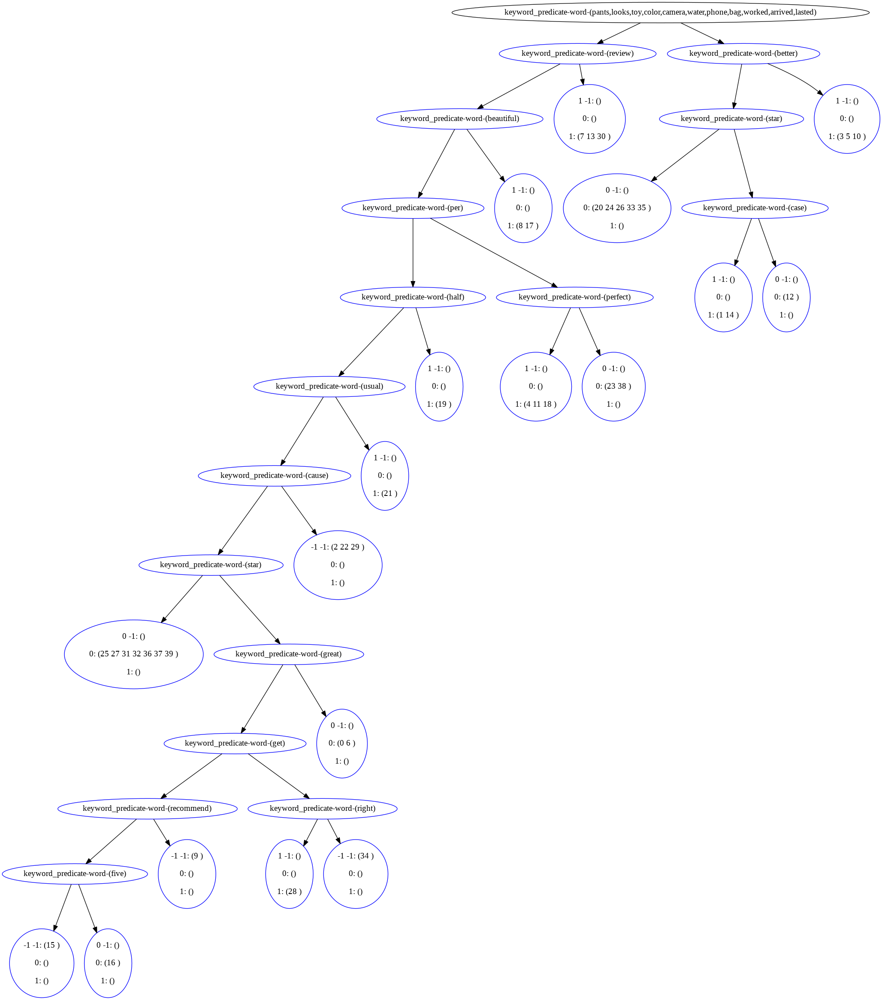

current queue: (keyword_predicate-word-(pants,looks,toy,color,camera,water,phone,bag,worked,arrived,lasted), [])
cur_node: keyword_predicate-word-(pants,looks,toy,color,camera,water,phone,bag,worked,arrived,lasted), rancestors: []


current queue: (keyword_predicate-word-(review), [])
cur_node: keyword_predicate-word-(review), rancestors: []


current queue: (keyword_predicate-word-(better), [keyword_predicate-word-(pants,looks,toy,color,camera,water,phone,bag,worked,arrived,lasted)])
cur_node: keyword_predicate-word-(better), rancestors: [keyword_predicate-word-(pants,looks,toy,color,camera,water,phone,bag,worked,arrived,lasted)]


current queue: (keyword_predicate-word-(beautiful), [])
cur_node: keyword_predicate-word-(beautiful), rancestors: []


current queue: (keyword_predicate-word-(star), [keyword_predicate-word-(pants,looks,toy,color,camera,water,phone,bag,worked,arrived,lasted)])
cur_node: keyword_predicate-word-(star), rancestors: [keyword_predicate-word-(pants,looks,toy,colo

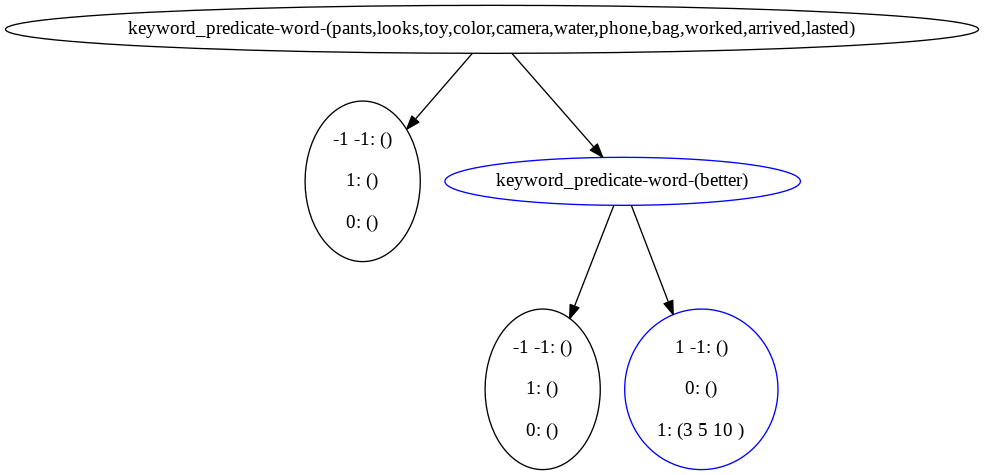

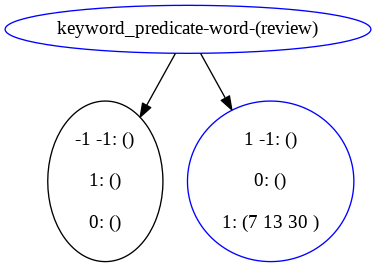

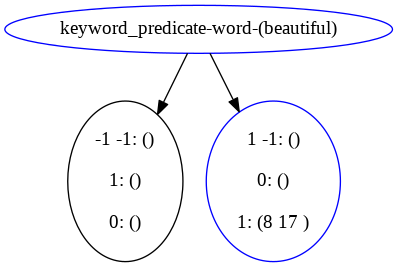

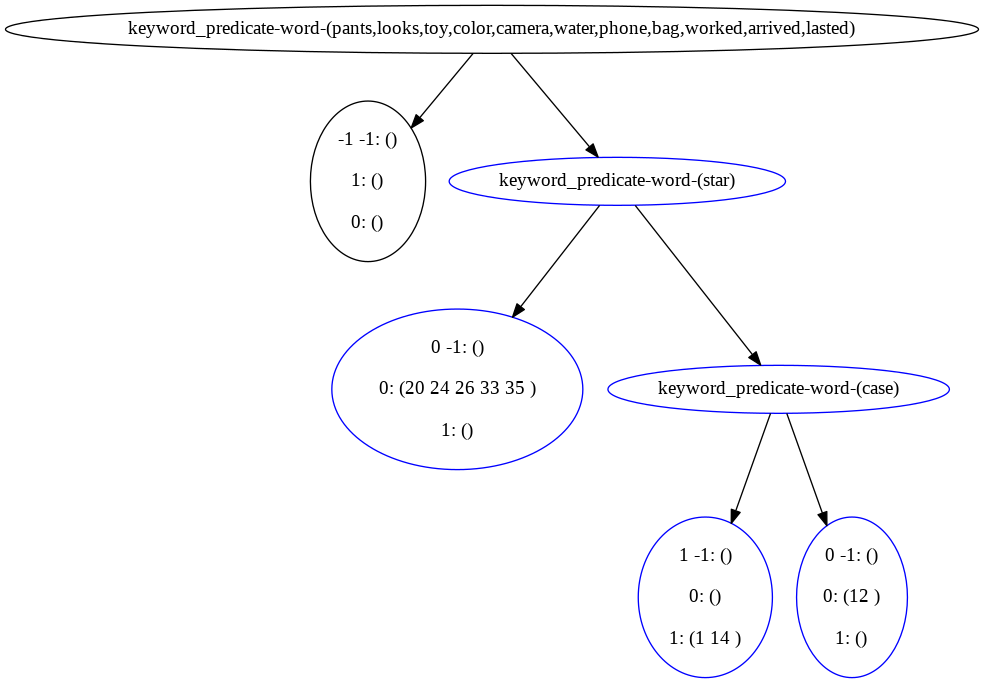

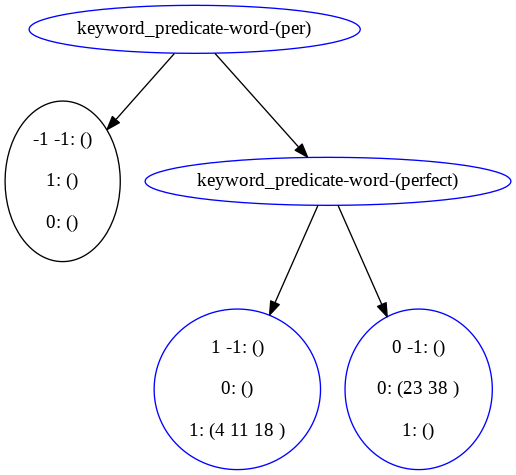

...

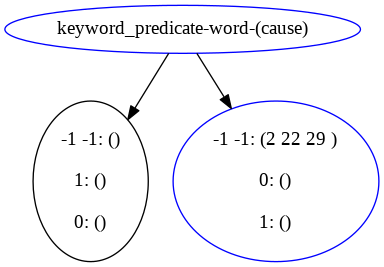

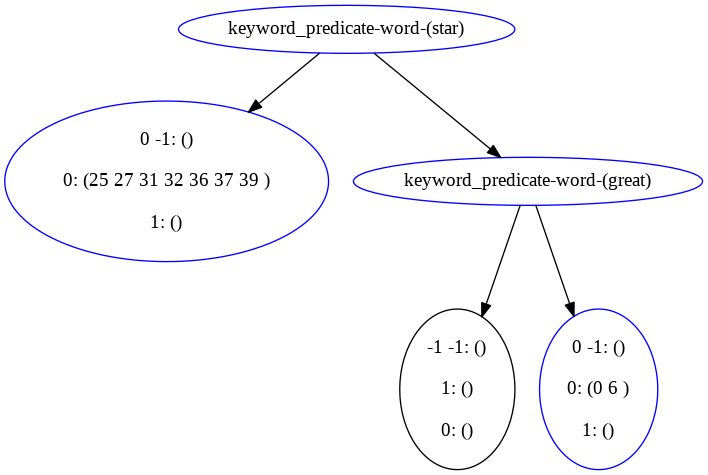

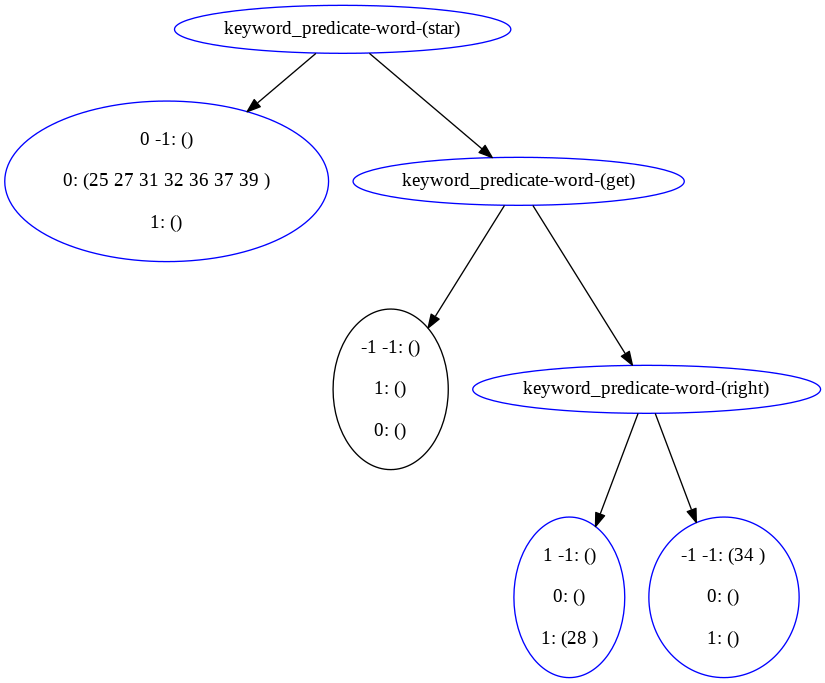

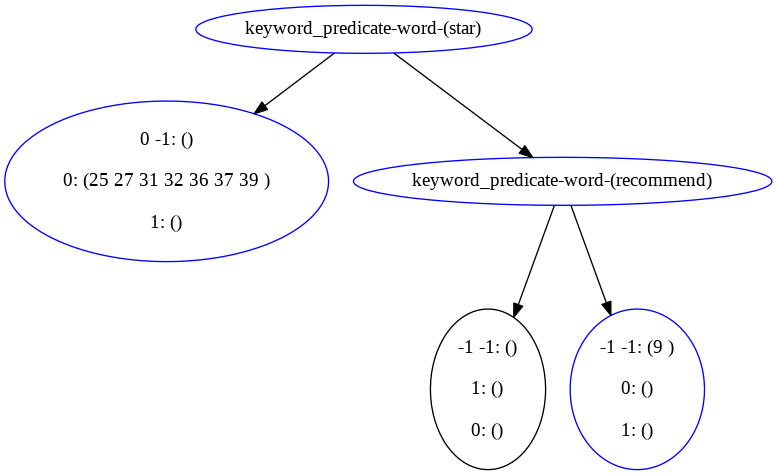

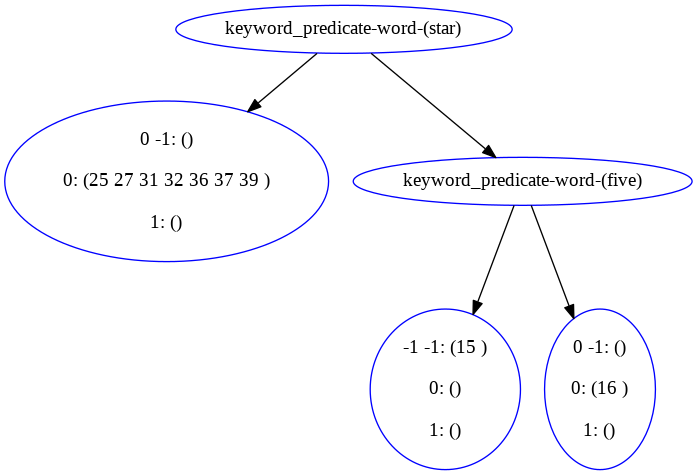



***********************************
the original tree now becomes: 


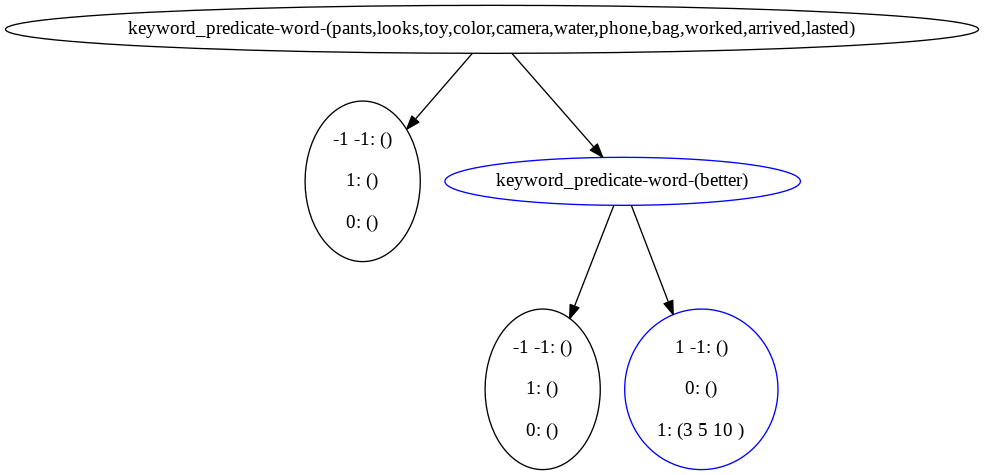

-----------------------------------------------------
original tree 15


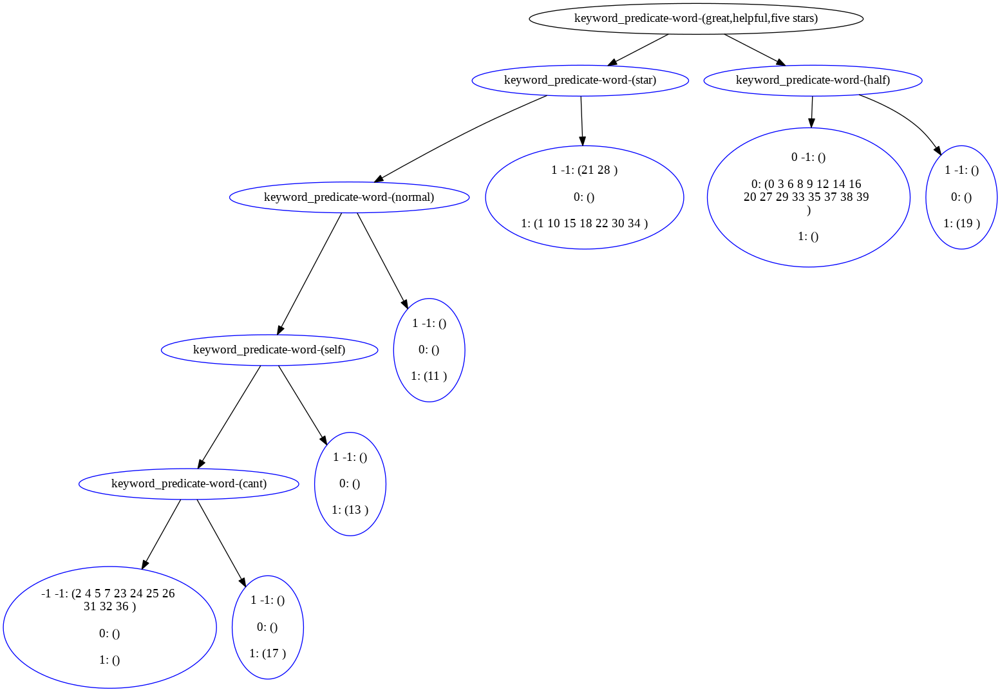

current queue: (keyword_predicate-word-(great,helpful,five stars), [])
cur_node: keyword_predicate-word-(great,helpful,five stars), rancestors: []


current queue: (keyword_predicate-word-(star), [])
cur_node: keyword_predicate-word-(star), rancestors: []


current queue: (keyword_predicate-word-(half), [keyword_predicate-word-(great,helpful,five stars)])
cur_node: keyword_predicate-word-(half), rancestors: [keyword_predicate-word-(great,helpful,five stars)]
current queue: (keyword_predicate-word-(normal), [])
cur_node: keyword_predicate-word-(normal), rancestors: []


current queue: (keyword_predicate-word-(self), [])
cur_node: keyword_predicate-word-(self), rancestors: []


current queue: (keyword_predicate-word-(cant), [])
cur_node: keyword_predicate-word-(cant), rancestors: []
new trees from cur rule:
[PredicateNode(id=1, pred=keyword_predicate-word-(great,helpful,five stars))
    LabelNode(id=19, label=-1)
    PredicateNode(id=4, pred=keyword_predicate-word-(half), added=True)
   

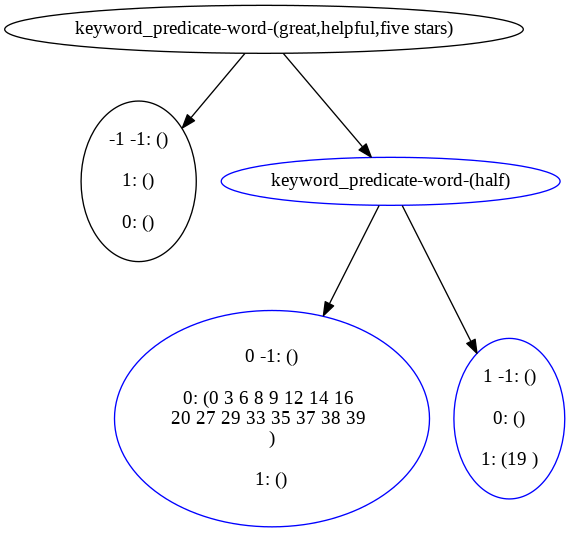

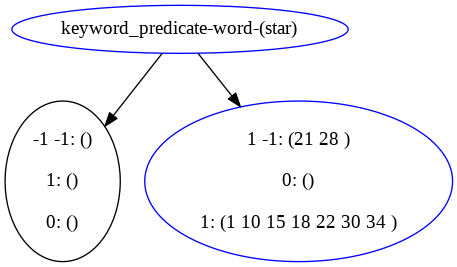

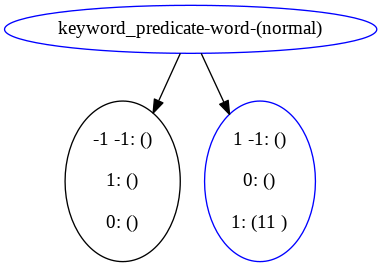

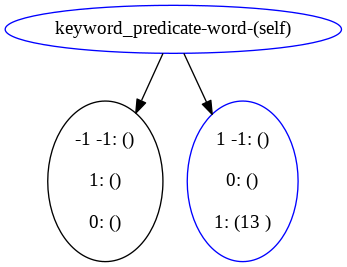

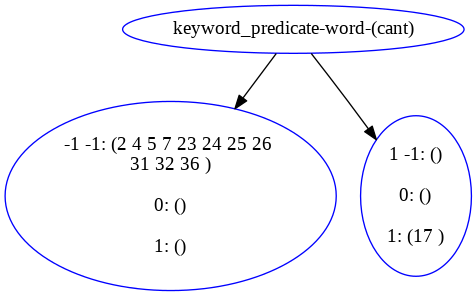



***********************************
the original tree now becomes: 


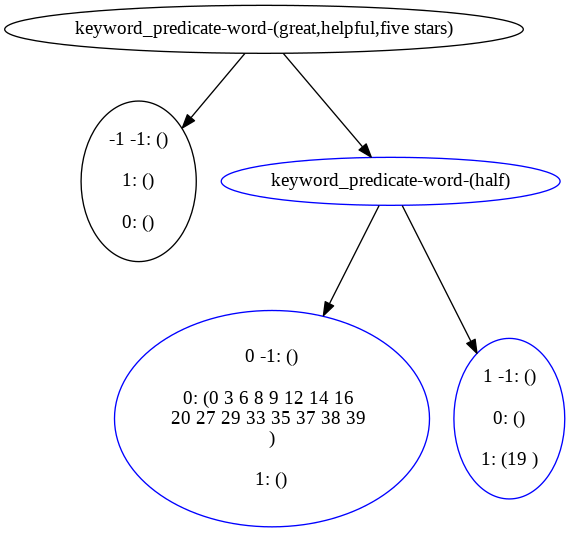

-----------------------------------------------------


In [9]:
for i in input_04075:
    cur_rule = input_04075[i]['rule']
    print(f"original tree {i}")
    dot_string=cur_rule.gen_dot_string('')
    graph = pydot.graph_from_dot_data(dot_string)[0]
    plt = Image(graph.create_png())
    display(plt)
#     print('\n')
    new_trees_from_cur_rule = post_process_break_tree_to_subtrees(cur_rule)
    print("new trees from cur rule:")
    print(new_trees_from_cur_rule)
    print("after process, the trees are \n ---------------------------------")
    for nt in new_trees_from_cur_rule:
        dot_string=nt.gen_dot_string('')
        graph = pydot.graph_from_dot_data(dot_string)[0]
        plt = Image(graph.create_png())
        display(plt)
        print('\n')
    print('***********************************')
    print("the original tree now becomes: ")
    dot_string=cur_rule.gen_dot_string('')
    graph = pydot.graph_from_dot_data(dot_string)[0]
    plt = Image(graph.create_png())
    display(plt)
    new_rules.extend(new_trees_from_cur_rule)
    print('-----------------------------------------------------')

In [10]:
#   A
#  / \ 
# -1 B
#   / \
#   C  D
#   /\  /\  
#  -1 0 -1 1

1: queue = [(A,[])], res = [A]
2: while(q)
   cur_node, R_ancestors = q.popleft()
   if(cur_node.left is Predicate):
       new_root = dupRancestors(cur_node.left, R_ancestors)
       res.append(new_root)
       queue.append((cur_node.left, R_ancestors))
       cur_node.left=LabelNode(ABSTAIN)
   if(cur_node.right is Predicate):
       new_ancestors = R_ancestors + cur_node
       queue.append((cur_node.right, new_ancestors))
       

In [11]:
len(new_rules)

133

In [12]:
new_lfs = [x.gen_label_rule() for x in new_rules]

In [13]:
from rbbm_src.labelling_func_src.src.lfs_tree import keyword_labelling_func_builder
from rbbm_src.labelling_func_src.src.TreeRules import SPAM, HAM, ABSTAIN
from rbbm_src.labelling_func_src.src.LFRepair import run_snorkel
from rbbm_src.labelling_func_src.src.classes import clean_text
import re
import psycopg2
import pandas as pd
from snorkel.labeling import (
	LabelingFunction, 
	labeling_function, 
	PandasLFApplier, 
	LFAnalysis,
	filter_unlabeled_dataframe
	)
from snorkel.labeling.model import MajorityLabelVoter, LabelModel


In [14]:
conn = psycopg2.connect(dbname='label', user='postgres')

In [15]:
sentences_df=pd.read_sql(f'SELECT * FROM amazon', conn)
sentences_df = sentences_df.rename(columns={"class": "expected_label", "content": "old_text"})
sentences_df['text'] = sentences_df['old_text'].apply(lambda s: clean_text(s))
sentences_df = sentences_df[~sentences_df['text'].isna()]

/tmp/ipykernel_16582/2148342826.py:1: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  sentences_df=pd.read_sql(f'SELECT * FROM amazon', conn)


In [16]:
applier = PandasLFApplier(lfs=new_lfs)
initial_vectors = applier.apply(df=sentences_df, progress_bar=False)
model = LabelModel(cardinality=2, verbose=True, device='cpu')
model.fit(L_train=initial_vectors, n_epochs=500, log_freq=100, seed=123)

probs_test= model.predict_proba(L=initial_vectors)

INFO 2024-10-10 02:51:22,937 [label_model.py:fit:905] Computing O...
INFO 2024-10-10 02:51:23,535 [label_model.py:fit:911] Estimating \mu...
100%|████████████████████████████████████████████████████| 500/500 [00:01<00:00, 424.50epoch/s]
INFO 2024-10-10 02:51:24,725 [label_model.py:fit:977] Finished Training


In [17]:
df_sentences_filtered, probs_test_filtered, filtered_vectors, df_no_signal  = filter_unlabeled_dataframe(
        X=sentences_df, y=probs_test, L=initial_vectors
)	

df_sentences_filtered = df_sentences_filtered.reset_index(drop=True)
prob_diffs = [abs(t[0]-t[1]) for t in probs_test_filtered]
prob_diffs_tuples = [(t[0],t[1]) for t in probs_test_filtered]
df_sentences_filtered['model_pred_diff'] = pd.Series(prob_diffs)
df_sentences_filtered['model_pred_prob_tuple'] = pd.Series(prob_diffs_tuples)
df_sentences_filtered['model_pred'] = pd.Series(model.predict(L=filtered_vectors))

wrong_preds = df_sentences_filtered[(df_sentences_filtered['expected_label']!=df_sentences_filtered['model_pred'])]
# df_sentences_filtered.to_csv('predictions_shakira.csv', index=False)
# logger.critical(wrong_preds)
accuracy=(len(df_sentences_filtered)-len(wrong_preds))/len(df_sentences_filtered)

print(f"""
    out of {len(sentences_df)} sentences, {len(df_sentences_filtered)} actually got at least one signal to \n
    make prediction. Out of all the valid predictions, we have {len(wrong_preds)} wrong predictions, \n
    accuracy = {(len(df_sentences_filtered)-len(wrong_preds))/len(df_sentences_filtered)} 
    """)


    out of 199591 sentences, 199591 actually got at least one signal to 

    make prediction. Out of all the valid predictions, we have 106166 wrong predictions, 

    accuracy = 0.4680822281565802 
    


In [18]:
import numpy as np

In [19]:
total_elements = initial_vectors.size

In [20]:

# Calculate the number of "no signal" elements (only -1)
no_signal_elements = np.count_nonzero(initial_vectors == -1)

# Calculate the sparsity
sparsity = no_signal_elements / total_elements

In [21]:
sparsity

0.811583937272022

In [22]:
non_abstain_labels = np.sum(initial_vectors != -1, axis=1)

In [23]:
non_abstain_labels.shape

(199591,)

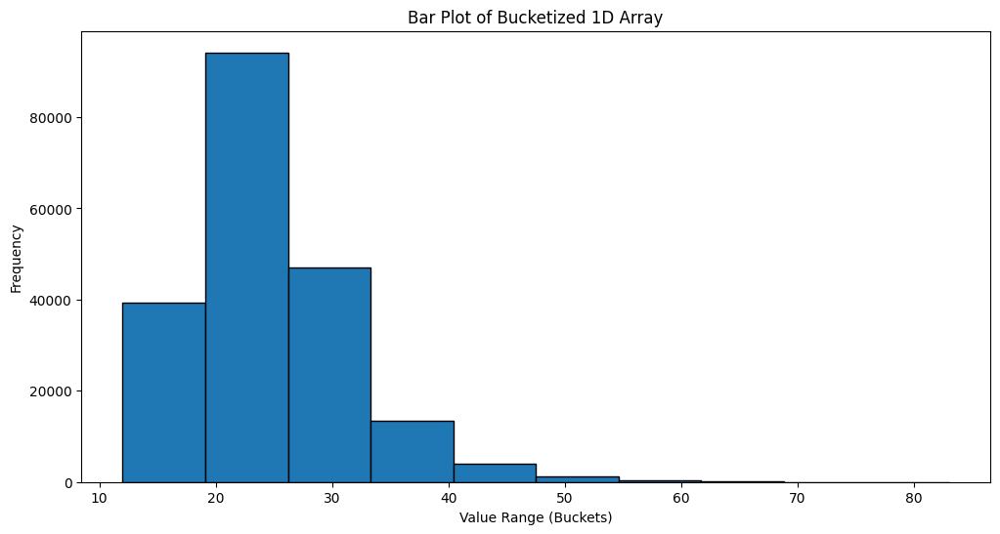

In [39]:
import numpy as np
import matplotlib.pyplot as plt


# Define the number of bins (intervals) for bucketization
num_bins = 10  # Adjust this value to increase or decrease the number of ranges

# Use np.histogram to bucketize the array into specified ranges
hist, bin_edges = np.histogram(non_abstain_labels, bins=num_bins)

# Calculate the bin centers for plotting purposes
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# Create a bar plot of the bucketized data
plt.figure(figsize=(12, 6))  # Set figure size for better visibility
plt.bar(bin_centers, hist, width=(bin_edges[1] - bin_edges[0]), edgecolor='black')
plt.xlabel('Value Range (Buckets)')
plt.ylabel('Frequency')
plt.title('Bar Plot of Bucketized 1D Array')
plt.show()

In [25]:
with open('random_sample_state42_amazon_full_la_0.4_ia_0.75_input.pkl', 'rb') as f04075_2:
    input_04075_2 = pickle.load(f04075_2)

In [26]:
for i in input_04075:
    input_04075_2[i]['user_input']['id'] = input_04075_2[i]['user_input'].reset_index().index
fix_rules_with_solver_input(fix_book_keeping_dict=input_04075_2)

In [28]:
input_04075_2

{0: {'rule': PredicateNode(id=1, pred=keyword_predicate-word-(star,stars))
      PredicateNode(id=7, pred=keyword_predicate-word-(better), added=True)
          PredicateNode(id=10, pred=keyword_predicate-word-(still), added=True)
              PredicateNode(id=13, pred=keyword_predicate-word-(beautiful), added=True)
                  PredicateNode(id=16, pred=keyword_predicate-word-(normal), added=True)
                      LabelNode(id=17, label=0, added=True)
                      LabelNode(id=18, label=1, added=True)
                  LabelNode(id=15, label=1, added=True)
              LabelNode(id=12, label=1, added=True)
          LabelNode(id=9, label=1, added=True)
      PredicateNode(id=4, pred=keyword_predicate-word-(five), added=True)
          LabelNode(id=5, label=1, added=True)
          LabelNode(id=6, label=0, added=True),
  'deleted': False,
  'pre_fix_size': 3,
  'after_fix_size': 13,
  'pre-deleted': False,
  'user_input':                                            

In [29]:
lfs_no_break = [x['rule'] for x in input_04075_2.values()]

In [31]:
new_lfs_no_break = [x.gen_label_rule() for x in lfs_no_break]

In [32]:


sentences_df=pd.read_sql(f'SELECT * FROM amazon', conn)
sentences_df = sentences_df.rename(columns={"class": "expected_label", "content": "old_text"})
sentences_df['text'] = sentences_df['old_text'].apply(lambda s: clean_text(s))
sentences_df = sentences_df[~sentences_df['text'].isna()]
applier = PandasLFApplier(lfs=new_lfs_no_break)
initial_vectors = applier.apply(df=sentences_df, progress_bar=False)
model = LabelModel(cardinality=2, verbose=True, device='cpu')
model.fit(L_train=initial_vectors, n_epochs=500, log_freq=100, seed=123)

probs_test= model.predict_proba(L=initial_vectors)

df_sentences_filtered, probs_test_filtered, filtered_vectors, df_no_signal  = filter_unlabeled_dataframe(
        X=sentences_df, y=probs_test, L=initial_vectors
)	

df_sentences_filtered = df_sentences_filtered.reset_index(drop=True)
prob_diffs = [abs(t[0]-t[1]) for t in probs_test_filtered]
prob_diffs_tuples = [(t[0],t[1]) for t in probs_test_filtered]
df_sentences_filtered['model_pred_diff'] = pd.Series(prob_diffs)
df_sentences_filtered['model_pred_prob_tuple'] = pd.Series(prob_diffs_tuples)
df_sentences_filtered['model_pred'] = pd.Series(model.predict(L=filtered_vectors))

wrong_preds = df_sentences_filtered[(df_sentences_filtered['expected_label']!=df_sentences_filtered['model_pred'])]
# df_sentences_filtered.to_csv('predictions_shakira.csv', index=False)
# logger.critical(wrong_preds)
accuracy=(len(df_sentences_filtered)-len(wrong_preds))/len(df_sentences_filtered)

print(f"""
    out of {len(sentences_df)} sentences, {len(df_sentences_filtered)} actually got at least one signal to \n
    make prediction. Out of all the valid predictions, we have {len(wrong_preds)} wrong predictions, \n
    accuracy = {(len(df_sentences_filtered)-len(wrong_preds))/len(df_sentences_filtered)} 
    """)

/tmp/ipykernel_16582/3032604101.py:1: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  sentences_df=pd.read_sql(f'SELECT * FROM amazon', conn)
INFO 2024-10-10 03:26:29,179 [label_model.py:fit:905] Computing O...
INFO 2024-10-10 03:26:29,238 [label_model.py:fit:911] Estimating \mu...
100%|████████████████████████████████████████████████████| 500/500 [00:00<00:00, 673.43epoch/s]
INFO 2024-10-10 03:26:29,986 [label_model.py:fit:977] Finished Training



    out of 199591 sentences, 199591 actually got at least one signal to 

    make prediction. Out of all the valid predictions, we have 42062 wrong predictions, 

    accuracy = 0.7892590347260147 
    


In [33]:

# Calculate the number of "no signal" elements (only -1)
no_signal_elements = np.count_nonzero(initial_vectors == -1)

# Calculate the sparsity
sparsity = no_signal_elements / total_elements

In [34]:
sparsity

0.026587152682122157

In [35]:
non_abstain_labels_no_break = np.sum(initial_vectors != -1, axis=1)

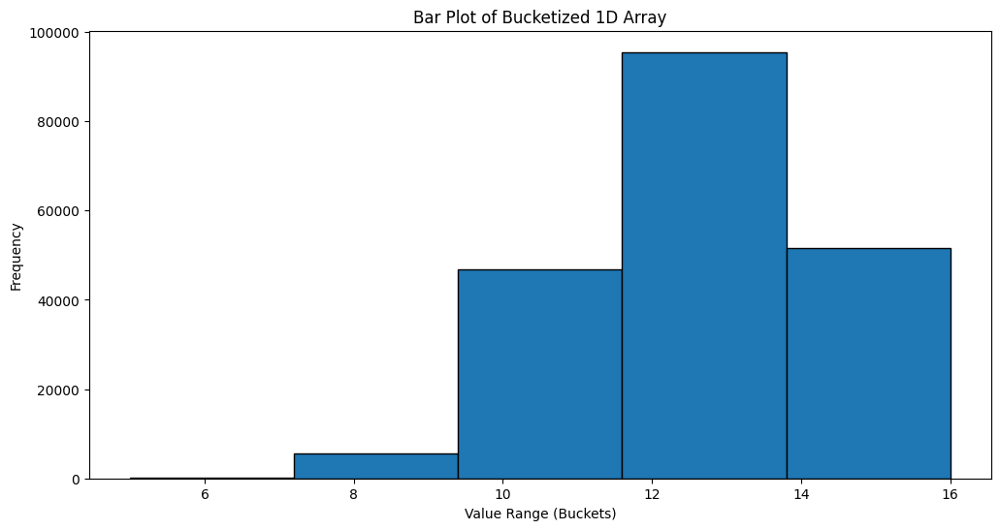

In [37]:
import numpy as np
import matplotlib.pyplot as plt


# Define the number of bins (intervals) for bucketization
num_bins =  # Adjust this value to increase or decrease the number of ranges

# Use np.histogram to bucketize the array into specified ranges
hist, bin_edges = np.histogram(non_abstain_labels_no_break, bins=num_bins)

# Calculate the bin centers for plotting purposes
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# Create a bar plot of the bucketized data
plt.figure(figsize=(12, 6))  # Set figure size for better visibility
plt.bar(bin_centers, hist, width=(bin_edges[1] - bin_edges[0]), edgecolor='black')
plt.xlabel('Value Range (Buckets)')
plt.ylabel('Frequency')
plt.title('Bar Plot of Bucketized 1D Array')
plt.show()